In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
%pylab inline
import re

Populating the interactive namespace from numpy and matplotlib


In [10]:
sms=pd.read_csv("convertcsv.csv")
sms.head()

,_protocol,_address,_date,_type,_subject,_body,_toa,_sc_toa,_service_center,_read,_status,_locked,_date_sent,_sub_id,_readable_date,_contact_name
0,0,+918310733183,1509032968509,1,NaN,You have 1 missed call(s) from +918310733183 ....,NaN,NaN,9.198451e+11,1,-1,0,1509032964000,1,"Oct 26, 2017 9:19:28 PM",Chimya
1,0,59039004,1509034252105,1,NaN,WhatsApp code 397-564.\r\n\r\nYou can also tap...,NaN,NaN,9.182999e+11,1,-1,0,1509034247000,1,"Oct 26, 2017 9:40:52 PM",(Unknown)
2,59,Airtel,1509037408272,1,NaN,Please open the following link to get manual i...,NaN,NaN,9.198451e+11,1,-1,0,1509037401000,1,"Oct 26, 2017 10:33:28 PM",(Unknown)
3,59,Airtel,1509037425141,1,NaN,To enjoy fastest Airtel data speeds on your sm...,NaN,NaN,9.198451e+11,1,-1,0,1509037402000,1,"Oct 26, 2017 10:33:45 PM",(Unknown)
4,0,AX-RECHRG,1509065238723,1,NaN,Congrats on your new 4G handset! Exclusive off...,NaN,NaN,9.198451e+11,1,-1,0,1509065233000,1,"Oct 27, 2017 6:17:18 AM",(Unknown)


In [11]:
sms.shape

(7864, 16)

In [12]:
sms_nan = (sms.isnull().sum() / sms.shape[0]) * 100
sms_nan

_protocol            0.000000
_address             0.000000
_date                0.000000
_type                0.000000
_subject           100.000000
_body                0.000000
_toa               100.000000
_sc_toa            100.000000
_service_center      4.577823
_read                0.000000
_status              0.000000
_locked              0.000000
_date_sent           0.000000
_sub_id              0.000000
_readable_date       0.000000
_contact_name        0.000000
dtype: float64

In [13]:
sms.drop(['_protocol','_date','_subject','_toa','_sc_toa','_status','_locked','_date_sent'],axis=1, inplace = True)
sms.head(10)

In [14]:
sms=sms.rename({'_body':'Body'},axis='columns')
sms.head()

,_protocol,_address,_date,_type,_subject,Body,_toa,_sc_toa,_service_center,_read,_status,_locked,_date_sent,_sub_id,_readable_date,_contact_name
0,0,+918310733183,1509032968509,1,NaN,You have 1 missed call(s) from +918310733183 ....,NaN,NaN,9.198451e+11,1,-1,0,1509032964000,1,"Oct 26, 2017 9:19:28 PM",Chimya
1,0,59039004,1509034252105,1,NaN,WhatsApp code 397-564.\r\n\r\nYou can also tap...,NaN,NaN,9.182999e+11,1,-1,0,1509034247000,1,"Oct 26, 2017 9:40:52 PM",(Unknown)
2,59,Airtel,1509037408272,1,NaN,Please open the following link to get manual i...,NaN,NaN,9.198451e+11,1,-1,0,1509037401000,1,"Oct 26, 2017 10:33:28 PM",(Unknown)
3,59,Airtel,1509037425141,1,NaN,To enjoy fastest Airtel data speeds on your sm...,NaN,NaN,9.198451e+11,1,-1,0,1509037402000,1,"Oct 26, 2017 10:33:45 PM",(Unknown)
4,0,AX-RECHRG,1509065238723,1,NaN,Congrats on your new 4G handset! Exclusive off...,NaN,NaN,9.198451e+11,1,-1,0,1509065233000,1,"Oct 27, 2017 6:17:18 AM",(Unknown)


In [15]:
sms['length'] = sms['Body'].apply(len)
sms

,_protocol,_address,_date,_type,_subject,Body,_toa,_sc_toa,_service_center,_read,_status,_locked,_date_sent,_sub_id,_readable_date,_contact_name,length
0,0,+918310733183,1509032968509,1,NaN,You have 1 missed call(s) from +918310733183 ....,NaN,NaN,9.198451e+11,1,-1,0,1509032964000,1,"Oct 26, 2017 9:19:28 PM",Chimya,146
1,0,59039004,1509034252105,1,NaN,WhatsApp code 397-564.\r\n\r\nYou can also tap...,NaN,NaN,9.182999e+11,1,-1,0,1509034247000,1,"Oct 26, 2017 9:40:52 PM",(Unknown),99
2,59,Airtel,1509037408272,1,NaN,Please open the following link to get manual i...,NaN,NaN,9.198451e+11,1,-1,0,1509037401000,1,"Oct 26, 2017 10:33:28 PM",(Unknown),190
3,59,Airtel,1509037425141,1,NaN,To enjoy fastest Airtel data speeds on your sm...,NaN,NaN,9.198451e+11,1,-1,0,1509037402000,1,"Oct 26, 2017 10:33:45 PM",(Unknown),334
4,0,AX-RECHRG,1509065238723,1,NaN,Congrats on your new 4G handset! Exclusive off...,NaN,NaN,9.198451e+11,1,-1,0,1509065233000,1,"Oct 27, 2017 6:17:18 AM",(Unknown),155
5,0,AD-OYORMS,1509091999193,1,NaN,Enjoy a double delight! Get a double occupancy...,NaN,NaN,9.198451e+11,1,-1,0,1509091973000,1,"Oct 27, 2017 1:43:19 PM",(Unknown),150
6,0,51501,1509109571178,1,NaN,Your Google verification code is 743610,NaN,NaN,9.182999e+11,1,-1,0,1509109567000,1,"Oct 27, 2017 6:36:11 PM",(Unknown),39
7,0,AM-PHONPE,1509110181441,1,NaN,46322 is your one time password to proceed on ...,NaN,NaN,9.198451e+11,1,-1,0,1509110178000,1,"Oct 27, 2017 6:46:21 PM",(Unknown),117
8,0,AM-SYNRUP,1509110950360,1,NaN,Your One Time Password(OTP) for Syndicate Bank...,NaN,NaN,9.198451e+11,1,-1,0,1509110946000,1,"Oct 27, 2017 6:59:10 PM",(Unknown),105
9,0,AM-PHONPE,1509110971125,1,NaN,You've received Rs.50 cashback from PhonePe in...,NaN,NaN,9.198451e+11,1,-1,0,1509110968000,1,"Oct 27, 2017 6:59:31 PM",(Unknown),134


In [16]:
sms['Body']

0       You have 1 missed call(s) from +918310733183 ....
1       WhatsApp code 397-564.\r\n\r\nYou can also tap...
2       Please open the following link to get manual i...
3       To enjoy fastest Airtel data speeds on your sm...
4       Congrats on your new 4G handset! Exclusive off...
5       Enjoy a double delight! Get a double occupancy...
6                 Your Google verification code is 743610
7       46322 is your one time password to proceed on ...
8       Your One Time Password(OTP) for Syndicate Bank...
9       You've received Rs.50 cashback from PhonePe in...
10      Recharge of Rs.50 for Airtel Mobile (994536905...
11      Recharge done on 27-10-2017 06:59PM,MRP:Rs50.0...
12      Benefit: Talktime of 39.37 in main account. Di...
13      PHONEPE-SMS-VERIFY 6271d77f72d575eedddaa7a9b4a...
14      Dear shreyas kulkarni. You have successfully r...
15       933946  is the otp for syndicate upi transaction
16      Your a/c no.XXXXXXXX055690 is has been registe...
17      SYN- I

In [17]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
li=[]
nostop=[]
for x in range (0,7864):

    stop_words = set(stopwords.words('english'))

    word_tokens = word_tokenize(sms['Body'][x])

    filtered_sentence = [w for w in word_tokens if not w in stop_words]

    filtered_sentence = []

    for w in word_tokens:
        if w not in stop_words:
            filtered_sentence.append(w)
    nostop.append(filtered_sentence)
    print(filtered_sentence)

['You', '1', 'missed', 'call', '(', ')', '+918310733183', '.Last', 'call', ':', '26-10-2017', '20:56', '.Enjoy', 'Hellotunes', ',', 'Sports', 'updates', 'Latest', 'NEWS', ',', 'call', '567892', '(', 'tollfree', ')']
['WhatsApp', 'code', '397-564', '.', 'You', 'also', 'tap', 'link', 'verify', 'phone', ':', 'v.whatsapp.com/397564']
['Please', 'open', 'following', 'link', 'get', 'manual', 'instructions', 'service', 'settings', '.', 'http', ':', '//10.89.22.101:9080/SADM/Manual', '?', 'grp=Auto+Device+Detection', '&', 'rcId=7', '&', 'msisdn=', '%', '2B919945369054', '&', 'dev=Xiaomi+MI5LTE']
['To', 'enjoy', 'fastest', 'Airtel', 'data', 'speeds', 'smartphone', ',', '.', 'RESTART', 'handset', ',', 'b.', 'insert', 'SIM', 'Slot', '1', '&', 'save', 'settings', 'sent', 'mobile', '.', 'If', 'asked', 'password', ',', 'use', '0000', 'c.', 'switch', 'ON', 'mobile', 'data', 'settings', '.', 'Now', 'manage', 'Airtel', 'accounts', 'easily', 'My', 'Airtel', 'app', '.', 'To', 'download', ',', 'click', 'h

['Shreyas', ',', 'Hurry', 'grab', 'amazing', 'last', 'minute', 'deals', 'OYO', '!', 'Book', 'TODAY', 'avail', '50', '%', 'OFF', 'Get', 'App', '-', 'bit.ly/2j8CJ2y', 'T', '&', 'C', 'Apply', '.', 'Call', '7065444454', 'STOP']
['Scratches', 'Old', 'Spectacles', '?', 'Visit', 'Lenskart', 'week', '&', 'get', '50', '%', 'Cashback', 'Exchange', 'old', 'Specs', 'Lenskart.com/grand', 'Find', 'store', ':', 'lenskart.com/s']
['Rs75', 'Cashback', '!', 'On', 'First', 'UPI', 'transaction', 'linked', 'Airtel', 'Payments', 'Bank', 'account', ',', 'stand', 'chance', 'Get', 'Rs', '75', 'Cashback', '.', 'Do', 'Now', '!', '!', 'T', '&', 'C', 'bit.ly/2j7rFRo']
['Shreyas', ',', 'Enjoy', 'room', 'view', '@', '50', '%', '.', 'Book', 'OYO', '0', '%', 'hassle', '.', 'Also', ',', 'get', '15', '%', 'cashback', 'Paytm', '-', 'bit.ly/2kghUyQ', 'T', '&', 'C', 'Apply', '.', 'Call', '7065444454', 'Stop']
['Sorry', '!', 'Your', 'Ola', 'Share', 'booking', 'OSN770071969', 'cancelled', 'driver', 'unable', 'serve', 'time',

['Your', 'code', '4598', '.', 'Return', 'RailWire', 'Wi-Fi', 'website', 'enter', 'code', 'get', 'online', '.']
['The', 'biggest', '#', 'TechMela', 'LIVE', '!', 'Shop', 'favourite', 'tech', 'starting', 'Rs', '.', '149', 'https', ':', '//goo.gl/Atiqwz', '+', 'FLAT', '10', '%', 'Off', 'code', 'SHOP2SAVEE', '+', 'EXTRA', '10', '%', 'Cashback']
['Get', 'Fit', 'year', 'Decathlon', ',', 'join', '#', 'FitUtsav', '20th-21st', 'Jan', 'participate', 'Yoga', ',', 'Cardio', ',', 'Pilates', ',', 'Cross', 'Training', 'etc.Register', 'http', ':', '//smsd.in/lLyDGDVu']
['SYN-', 'INR', '200.00', 'dr', 'A/C', '***5690', '18-01-2018', '06:20-for', 'ATM', 'txn', 'A1718001-NIEMYSORE-NIE', 'CAMPUS', 'MANANTAvl', 'Bal:19,364.85', '.', 'Helpline', '18004250585']
['Please', 'pay', 'bill', 'amount', 'Rs', '.', '29', 'cash', 'Ola', 'ride', ',', 'served', 'Lokanath', '.']
['You', '2', 'missed', 'Call', '[', ']', '+919591038273', '.Last', 'call', ':', '18-01-2018', '13:07', '.Get', 'Emergency', 'Alerts', 'Enjoy', '

['CallCost', ':', 'Rs.0.00', 'Duration:00:00:35', 'Bal', ':', 'Rs.0.09', '199=UL', 'CL+1.4GB/D,28D']
['<', '#', '>', '256037', 'OTP', 'Rapido', 'app', 'verification', '.', 'Vku3h7qjnN2']
['CallCost', ':', 'Rs.0.00', 'Duration:00:00:09', 'Bal', ':', 'Rs.0.09', '199=UL', 'CL+1.4GB/D,28D']
['Dear', 'User', ',', 'Thank', 'using', 'Rapido', '.', 'Your', 'invoice', 'amount', 'Order/Booking', 'ID', ':', 'RD1519471195406', 'Rs', '.', '48.37', 'Kindly', 'share', 'ride', 'experience', 'shoutout', '@', 'rapido.bike']
['Cycle', 'Utsav', '!', 'Join', 'us', 'March', '3rd', '4th', 'Nature', 'ride', '80K', 'cycling', '(', 'Two', 'way', ')', 'Camping', '.', 'For', 'Registration', 'call', '9738481442', '&', '9481154327']
['Your', 'Booking', '-', 'MYPV529930', 'due', 'soon', '.', 'The', 'following', 'documents', 'needed', 'renting', 'bike', ':', 'Valid', 'Driving', 'License', 'ride', 'motor-cycle', 'gear', 'India', '.', 'Any', 'two', 'following', ':', '.', 'Test', 'email', 'reservations', '@', 'metrobike

['CallCost', ':', 'Rs.0.00', 'Duration:00:00:37', 'Bal', ':', 'Rs.0.00', 'Upgrade', '4G', 'phone', '&', 'get', '1GB', 'data/day', '30', 'days', ',', 'call', '51111', '(', 'tollfree', ')', 'T', '&', 'C']
['Please', 'pay', 'bill', 'amount', 'Rs', '.', '79.0', 'cash', 'Ola', 'ride', ',', 'served', 'Nanda', '.']
['CallCost', ':', 'Rs.0.00', 'Duration:00:00:07', 'Bal', ':', 'Rs.0.00', '199=UL', 'CL+1.4GB/D,28D']
['SYN-', 'INR', '900.00', 'debited', 'A/C', 'No', '.', '***5690', '25-03-2018', '15:10-for', 'POS', 'txn', '49379001-037044019274290-HIGH', 'PARK', 'REVOLVIAvl', 'Bal:7,702.85', '.', 'Helpline', '18004250585']
['SYN-', 'INR', '310.00', 'debited', 'A/C', 'No', '.', '***5690', '25-03-2018', '16:16-for', 'POS', 'txn', '49378999-037044019274290-HIGH', 'PARK', 'REVOLVIAvl', 'Bal:7,392.85', '.', 'Helpline', '18004250585']
['Rs', '.', '40', 'paid', 'Kiran', '(', '9738117713', ')', '.', 'For', 'reference', ',', 'wallet', 'transaction', 'id', '18265286880', '.', 'Updated', 'balance', ':', 'R

['Play', 'Rummy', 'FREE', '!', 'Rs.1,000', 'Welcome', 'Bonus', 'Click', 'Here', ':', 'http', ':', '//vls.bz/OSMOGrMwQFg', 'Win', 'REAL', 'Money', '!', 'opt-out', ':', 'CARDSTOP', '56161']
['Parikrama', '&', 'Agam', 'performing', 'live', 'TODAY', 'Prestige', 'Jindal', 'City', ',', 'No', 'Entry', 'Fee', '!', 'Walk-in', '4', 'PM', 'today', '.', 'RSVP', ':', '18003130080', 'Location', 'Map', ':', 'https', ':', '//goo.gl/r1B3ha']
['Refer', '5', 'friends', 'Rapido', ',', 'get', 'assured', 'gift', 'us', '.', 'One', 'lucky', 'winner', 'gets', 'brand', 'new', 'Air', 'Cooler', '.', 'Refer', 'Now', ':', 'https', ':', '//ob82.app.link/referral']
['<', '#', '>', '9428', 'login', 'OTP', '.', 'Treat', 'confidential', '.', 'Goibibo', 'never', 'call', 'verify', 'OTP', '.', 'aA7YXnBciKU']
['PNR:8558381177', ',', 'TRN:17318', ',', 'DOJ:21-04-18', ',', 'SL', ',', 'LTT-BGM', ',', 'DP:18:45', ',', 'SANJEEVA', 'KULKARN', ',', 'S2', '56', ',', 'Fare:425.This', 'rail', 'travel', 'insured']
['Rs', '.', '2,00,00

['BELIEVER']
['Result', ':', '(', 'BELIEVER', ')', '1', '.', 'Believer', '2', '.', 'Non', 'Believer', '3', '.', 'Im', 'A', 'Believer', '4', '.', 'The', 'Believer', 'Instrumental', '5', '.', 'Daydream', 'Believer', '(', 'I', 'Dreamed', 'Please', 'reply', 'SMS', 'option', 'number', 'choice', '.', 'Your', 'JioTune', 'free', 'charge', '&', 'valid', '30', 'days', '.', 'To', 'search', 'songs', ',', 'reply', 'SMS', 'MORE', '.']
['1']
['You', 'selected', 'Believer', 'JioTune', '.', 'Please', 'reply', 'SMS', 'option', 'number', 'choice', 'set', 'tune', '1', '.', 'All', 'callers']
['1']
['Dear', 'Customer', ',', 'You', 'requested', 'activation', 'JioTunes', 'service', '.', 'To', 'confirm', 'please', 'reply', 'Y', 'message', 'within', '30', 'minutes', '.', 'Charges', ':', 'Rs', '.', '0.0', 'Validity', ':', '30', 'days', 'Thank', ',', 'Team', 'Jio']
['Y']
['Dear', 'Customer', ',', 'JioTunes', 'service', 'activated', 'Jio', 'Number', '6361924355', '.', 'Valid', 'Till', ':', '07-Jun-2018', 'Charges'

['ನಿಮ್ಮ', 'ದೈನಂದಿನ', 'ಹೈ', 'ಸ್ಪೀಡ್', 'ಇಂಟರ್ನೆಟ್', 'ಕೋಟಾದ', 'ಶೇಖಡ', '50', '%', 'ರಷ್ಟು', '1.5', 'GB', 'ಡೇಟಾ', 'ಅನ್ನು', 'ಬಳಸಿದ್ದೀರಿ', 'ನಿಮ್ಮ', 'ಜಿಯೊ', 'ಸಂಖ್ಯೆ', '6361924355', 'ಯ', 'ಮೇಲೆ', 'ಇಷ್ಟರ', '05-Jun-18', '16:49', 'Hrs', 'ಹೊತ್ತಿಗೆ', '.', 'ನಿಮ್ಮ', 'ಬ್ಯಾಲೆನ್ಸ್', 'ಮತ್ತು', 'ಬಳಕೆಯನ್ನು', 'ಪತ್ತೆಹಚ್ಚಲು', ',', '1299', 'ಕ್ಕೆ', 'ಮಿಸ್ಸೇಡ್', 'ಕಾಲ್', 'ಅನ್ನು', 'ನೀಡಿ', '.', 'ನಿಮ್ಮಜಿಯೊಖಾತೆಯನ್ನು', 'ಹೇಗೆ', 'ನಿರ್ವಹಿಸುವುದು', 'ಎಂಬುದರ', 'ಕುರಿತು', 'ಇನ್ನಷ್ಟು', 'ತಿಳಿಯಲು', ',', 'http', ':', '//tiny.jio.com/MyJioVideo', 'ಕ್ಲಿಕ್', 'ಮಾಡಿ', '.', 'ನಿಮ್ಮ', 'ಪ್ರಸ್ತುತ', 'ಬ್ಯಾಲೆನ್ಸ್', ',', 'ವ್ಯಾಲಿಡಿಟಿ', ',', 'ಯೋಜನೆ', 'ವಿವರಗಳು', 'ಮತ್ತು', 'ಅತ್ಯಾಕರ್ಷಕ', 'ರೀಚಾರ್ಜ್', 'ಯೋಜನೆಗಳ', 'ಬಗ್ಗೆ', 'ತಿಳಿಯಲು', '1991ಗೆ', 'ಡಯಲ್', 'ಮಾಡಿ', '.']
['Return', 'Request', 'Accepted', ':', 'The', 'seller', 'arranged', 'replacement', 'U.S.ELK', '...', 'order', 'order', 'ID', 'OD212469664539376000', '.', 'A', 'Wishmaster', 'pick', 'originally', 'delivered', 'item', 'Sunday', ',', 'Jun', '10', ',', '2018', 'deliver', 'replacement', 'time', '.', 'Plea

['Airtel', 'data-meter', '!', 'Now', 'listen', 'music', ',', 'watch', 'movies', '&', 'keep', 'track', 'data', '.', 'Just', 'download', 'My', 'Airtel', 'App', '.', 'Click', 'www.airtel.in/5/DataUse3']
['Your', 'One', 'Time', 'Password', '(', 'OTP', ')', 'Syndicate', 'Bank', 'online', 'transaction', '7954', '.', 'Do', 'disclose', 'one']
['We', 'sorry', 'payment', 'Sanju', 'Cinepolis', ':', 'Urban', 'Oasis', 'Mall', ',', 'Hubli', '(', 'SCREEN', '5', ')', 'failed', '.', 'Pls', 'try', 'later', '.']
['Your', 'txn', 'Debit', 'card', 'ending', '5842', 'declined', '04/Jul/18', '14:25', 'Ecom', 'BDR00001', 'BOOKMYSHOW', 'due', 'Invalid', 'CVV', '.']
['SYN-', 'INR', '420.00', 'debited', 'A/C', 'No', '.', '***5690', '04-07-2018', '14:31-for', 'POS', 'txn', '11459169-000011690077222-URBAN', 'OASISI', 'HUBLAvl', 'Bal:8,281.57', '.', 'If', 'You', 'Find', 'Txn', 'Suspicious', ',', 'SMS', 'BLOCK', '<', 'space', '>', '<', '16digit', 'Card', 'No', '>', '9210332255', 'Block', 'Your', 'Card', 'Temporarily'

['Get', '20', '%', 'upto', 'Rs.29', 'next', 'Ola', 'auto', 'ride', 'code', 'MYS20', '.', 'Valid', '2', 'auto', 'rides', 'till', '27th', 'July', 'b/w', '6', 'am-10', 'pm', 'Mysore', '.', 'Book', 'Now', ':', 'bit.ly/C_SMS']
['Flat', 'Rate', 'Here', '...', '..', 'Flat19', 'upto', '5', 'KM', 'across', 'Mysuru', '1:00', 'PM-5:00', 'PM', '.', 'Commute', 'comfort', 'like', 'King', 'affordable', 'tariff', '.', 'Book', 'Ride', ':', 'goo.gl/SXCKof']
['I', '’', 'travelling', 'Ola', 'Share', 'cab', '.', 'My', 'driver', 'Prashanth', 'S', '(', '8884449547', ')', '.', 'OTP', ':', '8134', '.', 'Track', ':', 'https', ':', '//olacabs.com/track/olashare/a6e45c3384841']
['Hey', 'Shreyas', ',', 'Cool', 'Casual', 'Shoes', ',', 'Stylish', 'Slippers', '&', 'Sandals', 'Men', '999', '.', 'Check', 'cool', 'collection', '!', 'snpdl.in/jjxutfmb']
['Play', 'Rummy', 'FREE', '!', 'Rs.1,000', 'Welcome', 'Bonus', 'Click', 'Here', ':', 'https', ':', '//bit.ly/2FZNFXh', 'Win', 'REAL', 'Money', '!', 'opt-out', ':', 'CARDS

['Hi', 'Shreyas', ',', 'Mega', 'discount', 'upto', '70', '%', 'Home', 'Decor', ',', 'Kitchen', 'appliances', '&', '.', 'Add', 'cart', '!', 'snpdl.in/jkp0hwqi']
['Rs149=Unlimited', 'Local', 'STD', 'Roaming', 'calls', 'along', '1GB/day', '100', 'SMS/day', '28', 'days', '.']
['Your', 'secure', 'OTP', '223508', '.', 'Please', "n't", 'share', 'OTP', 'anyone', '.', 'Happy', 'Biking', '.']
['Your', 'A/c', 'XXX5690', 'debited', 'INR', '333.00', '11-AUG-2018', '10:11:44', 'PM', '.', 'TRFR', '.', 'Avl', 'Bal', 'INR', '9,718.32']
['shreyassk987', '@', 'okaxis', 'linked', 'a/c', 'XXXXXXXX055690', 'debited', 'Rs.333.00', '11/Aug/2018', '22:11:38', '(', 'UPI', 'Ref', '822322148144', ')', '.If', 'find', 'txn', 'suspicious', ',', 'send', 'BLOCKUPI', '9220092200', '.', 'Tollfree', '18002083333', '180030113333']
['Hi', 'shreyas', 'kulkarni', ',', 'booking', 'confirmed', ',', 'Booking', 'ID', 'OR105790', '.', 'Station', 'Location', '-', 'onnb.in/mysgaruda', '.', 'Your', 'secret', 'pick', 'code', '-', '65

['Join', 'Tez', ',', 'payments', 'app', 'Google', '.', 'Enter', 'code', '(', 'ry3Fx', ')', 'make', 'payment', '.', 'We', "'ll", 'get', '₹51', '!', 'https', ':', '//g.co/tez/ry3Fx']
['shreyassk987', '@', 'okaxis', 'linked', 'a/c', 'XXXXXXXX055690', 'credited', 'Rs.51.00', '30/Aug/2018', '19:58:12', '(', 'UPI', 'Ref', '824219095304', ')']
['Your', 'transaction', 'failed', 'due', 'Invalid', 'UPIN', '.', 'Kindly', 'enter', 'correct', 'UPIN', 'reset', 'UPIN', '.']
['Your', 'A/c', 'XXX5690', 'debited', 'INR', '51.00', '30-AUG-2018', '07:59:30', 'PM', '.', 'TRFR', '.', 'Avl', 'Bal', 'INR', '357.32']
['shreyassk987', '@', 'okaxis', 'linked', 'a/c', 'XXXXXXXX055690', 'debited', 'Rs.51.00', '30/Aug/2018', '19:59:26', '(', 'UPI', 'Ref', '824220267990', ')', '.If', 'find', 'txn', 'suspicious', ',', 'send', 'BLOCKUPI', '9220092200', '.', 'Tollfree', '18002083333', '180030113333']
['Your', 'A/c', 'XXX5690', 'credited', 'INR', '51.00', '30-AUG-2018', '07:58:15', 'PM', '.', 'TRFR', '.', 'Avl', 'Bal', 

['Play', 'Rummy', 'FREE', '!', 'Rs.1,000', 'Welcome', 'Bonus', 'Click', 'Here', ':', 'https', ':', '//bit.ly/2FZNFXh', 'Win', 'REAL', 'Money', '!', 'opt-out', ':', 'CARDSTOP', '56161']
['Congratulations', '!', 'Pay', 'Just', 'Rs', '695', 'pm', '&', 'Get', 'Rs', '1', 'CRORE', 'Lifecover', '.', 'Secure', 'today', 'Term', 'Insurance', 'Plan', '.', 'tx4.in/2iVfG09']
['Get', '10', '%', 'CASHBACK', 'ShopClues', 'paying', 'Airtel', 'Payments', 'Bank', 'Airtel', 'Money', 'Wallet', '!', 'Minimum', 'transaction', 'Rs1000', '.', 'Click', 'bit.ly/2ITFC2K', 'T', '&', 'C', 'Apply', '.']
['Flat19', 'Here', '!', '!', '!', 'Ride', 'across', 'Mysuru', 'Just', 'INR19', 'upto', '4KM', '.', 'goo.gl/SXCKof']
['Thanks', 'choosing', 'Domino', "'s", '.', 'We', 'deliver', 'order', 'hot', '&', 'fresh', '30', 'minutes', '.', 'Order', 'Details', '-', 'Amount', ':', 'Rs', '.', '239', '|', 'Order', '.', '69', '|', 'Track', 'order', 'accurately', 'using', 'Domino', "'s", 'app', '@', 'https', ':', '//bit.ly/2C4BSZi']


['ನಿಮ್ಮ', 'ದೈನಂದಿನ', 'ಹೈ', 'ಸ್ಪೀಡ್', 'ಇಂಟರ್ನೆಟ್', 'ಕೋಟಾದ', 'ಶೇಖಡ', '90', '%', 'ರಷ್ಟು', '1.5', 'GB', 'ಡೇಟಾ', 'ವನ್ನು', 'ಬಳಸಿದ್ದೀರಿ', 'ನಿಮ್ಮ', 'ಜಿಯೊ', 'ಸಂಖ್ಯೆ', '6361924355', 'ಯ', 'ಮೇಲೆ', '.', 'ಇಷ್ಟರ', '04-Oct-18', '21:29', 'Hrs', 'ಹೊತ್ತಿಗೆ', '.', 'ಉಳಿದ', '1.5', 'GB', 'ಡೇಟಾ', 'ಪೂರ್ಣ', 'ಗೊಂಡ', 'ಬಳಿಕ', 'ಯಾವುದೇ', 'ಸಕ್ರಿಯ', 'ಡೇಟಾ', 'ಯೋಜನೆಯನ್ನು', 'ಹೊಂದಿಲ್ಲದಿದ್ದರೆ', 'ಇಂಟರ್ನೆಟ್', 'ವೇಗ', 'ಕಡಿಮೆಯಾಗುತ್ತದೆ', '.', 'ಡೇಟಾ', 'ಬೂಸ್ಟರ್', 'ನೊಂದಿಗೆ', 'ರೀಚಾರ್ಜ್', 'ಮಾಡಲು', 'ಮತ್ತು', 'ಹೈ', 'ಸ್ಪೀಡ್', 'ಇಂಟರ್ನೆಟ್', 'ಅನ್ನು', 'ಮುಂದುವರಿಸುವುದಕ್ಕೆ', 'http', ':', '//tiny.jio.com/DataBooster', 'ಅನ್ನು', 'ಕ್ಲಿಕ್', 'ಮಾಡಿ', '.', 'ನಿಮ್ಮ', 'ಪ್ರಸ್ತುತ', 'ಬ್ಯಾಲೆನ್ಸ್', ',', 'ಮಾನ್ಯತೆ', ',', 'ಯೋಜನೆ', 'ವಿವರಗಳು', 'ಮತ್ತು', 'ಅತ್ಯಾಕರ್ಷಕ', 'ರೀಚಾರ್ಜ್', 'ಯೋಜನೆಗಳಿಗಾಗಿ', 'ತಿಳಿಯಲು', '1991', 'ಡಯಲ್', 'ಮಾಡಿ', '.', 'ನಿಮ್ಮ', 'ಡೇಟಾ', 'ಬಳಕೆಯನ್ನು', 'ಹೇಗೆ', 'ನಿರ್ವಹಿಸುವುದು', 'ಎಂಬುದರ', 'ಕುರಿತು', 'ಸುಳಿವುಗಳಿಗಾಗಿ', ',', 'https', ':', '//youtu.be/s-5QfLGTm44', 'ಕ್ಲಿಕ್', 'ಮಾಡಿ', '.']
['ನಿಮ್ಮ', 'ದೈನಂದಿನ', 'ಹೈ', 'ಸ್ಪೀಡ್', 'ಇಂಟರ್ನೆಟ್', 'ಕೋಟಾದ', 'ಸಂಪೂರ್ಣ', '1.5',

['Result', ':', '(', 'THUNDER', ')', '1', '.', 'Thunderbolt', '2', '.', 'Thundersteel', '3', '.', 'Thunderstruck', '4', '.', 'Thunderball', '(', 'Thunderball', ')', '5', '.', 'Kuri', 'Thunderbolt', 'Wargi', 'Thunder', '6', '.', 'Feel', 'The', 'Thunder', '7', '.', 'High', 'Heel', 'Thunderbolt', '8', '.', 'I', 'Hear', 'A', 'Thunder', '9', '.', 'I', 'Hear', 'Thunder', '10', '.', 'Rain', '&', 'Thunder', 'Efx', 'Please', 'reply', 'SMS', 'option', 'number', 'choice', '.', 'Your', 'JioTune', 'free', 'charge', '&', 'valid', '30', 'days', '.', 'To', 'search', 'songs', ',', 'reply', 'SMS', 'MORE', '.', 'For', 'searching', 'songs', 'please', 'reply', 'MORE', '.']
['6']
['You', 'selected', 'Feel', 'The', 'Thunder', 'JioTune', '.', 'Please', 'reply', 'SMS', 'option', 'number', 'choice', 'set', 'tune', '1', '.', 'All', 'callers']
['1']
['Dear', 'Customer', ',', 'You', 'requested', 'activation', 'JioTunes', 'service', '.', 'To', 'confirm', 'please', 'reply', 'Y', 'message', 'within', '30', 'minutes',

['Add', 'Google', 'chrome']
['Top', 'right', 'corner', ':', '.']
['Add', 'ixel.in']
['Okay']
['Your', 'A/c', 'XXX5690', 'credited', 'INR', '31.00', '30-OCT-2018', '03:49:32', 'PM', '.', 'TRFR', '.', 'Avl', 'Bal', 'INR', '225.68']
['shreyassk987', '@', 'okaxis', 'linked', 'a/c', 'XXXXXXXX055690', 'credited', 'Rs.31.00', '30/Oct/2018', '15:49:23', '(', 'UPI', 'Ref', '830315187265', ')']
['Grab', "'s", 'gone', '!', 'Ride', 'Flat', 'Fares', 'city', '.', 'Only', 'Rs.19', '4kms', '.', 'Book', '!', 'goo.gl/SXCKof']
['Hurry', '!', 'Flat', '50', '%', '2', 'orders', '.', 'Only', '24', 'hours', 'left', 'use', 'Uber', 'Eats', 'code', 'GRUB16', 'get', '50', '%', 'delicious', 'grub', ',', 'max', 'disc', 'Rs.100', '.', 'TCA', '.', 't.uber.com/wb']
['Your', 'A/c', 'XXX5690', 'credited', 'INR', '36.00', '30-OCT-2018', '06:16:27', 'PM', '.', 'TRFR', '.', 'Avl', 'Bal', 'INR', '261.68']
['shreyassk987', '@', 'okaxis', 'linked', 'a/c', 'XXXXXXXX055690', 'credited', 'Rs.36.00', '30/Oct/2018', '18:16:18', '(

['Skip', 'queue', '&', 'Pay', 'Bills', 'Easily', '!', 'Electricity', 'Bill', 'Payments', 'accepted', 'nearest', 'Airtel', 'Payments', 'Bank', 'retailer', 'Visit', 'nearest', 'Airtel', 'retailer']
['MERI', 'KAHANI']
['Result', ':', '(', 'MERI', 'KAHANI', ')', '1', '.', 'Meri', 'Kahani', '2', '.', 'Meri', 'Kahani', 'Bhoolne', 'Wale', '3', '.', 'Teri', 'Meri', 'Kahani', '4', '.', 'Teri', 'Meri', 'Kahani', 'Adhuri', '5', '.', 'Teri', 'Meri', 'Kahani', 'Ammiye', '6', '.', 'Tu', 'Meri', 'Kahani', '7', '.', 'Ye', 'Hai', 'Meri', 'Kahani', '8', '.', 'Yeh', 'Hai', 'Meri', 'Kahani', '9', '.', 'Jago', 'Sonewalo', 'Suno', 'Meri', 'Kahani', '10', '.', 'Meri', 'Kahani', 'Haz', 'Ka', 'Mahina', 'Please', 'reply', 'SMS', 'option', 'number', 'choice', '.', 'Your', 'JioTune', 'free', 'charge', '&', 'valid', '30', 'days', '.', 'To', 'search', 'songs', ',', 'reply', 'SMS', 'MORE', '.', 'For', 'searching', 'songs', 'please', 'reply', 'MORE', '.']
['Your', 'code', '7417', '.', 'Return', 'RailWire', 'Wi-Fi', '

['Thrilling', 'Thursday-', 'Join', 'Ind', 'vs', 'Aus', '2nd', 'T20', '&', 'Win', 'Lakhs', '.', 'Check', 'FanFight', 'wallets', 'deposit', 'coupons', '.', 'https', ':', '//fanfight.onelink.me/UoH7/SMS22Nov']
['Hello', ',', 'mi', 'requested', 'money', 'Google', 'Pay', 'UPI', 'app', '.', 'On', 'approving', 'request', ',', 'Rs', '.', '249.00', 'debited', 'account', '.']
['Your', 'A/c', 'XXX5690', 'debited', 'INR', '249.00', '22-NOV-2018', '09:53:16', 'PM', '.', 'TRFR', '.', 'Avl', 'Bal', 'INR', '1,175.73']
['shreyassk987', '@', 'okaxis', 'linked', 'a/c', 'XXXXXXXX055690', 'debited', 'Rs.249.00', '22/Nov/2018', '21:50:03', '(', 'UPI', 'Ref', '832621880464', ')', '.If', 'find', 'txn', 'suspicious', ',', 'send', 'BLOCKUPI', '9220092200', '.', 'Tollfree', '18002083333', '180030113333']
['You', 'used', '90', '%', 'daily', '1.50', 'GB', 'high', 'speed', 'internet', 'quota', 'Jio', 'Number', '6361924355', '23-Nov-18', '00:13', '.', 'After', 'consumption', '1.50', 'GB', 'data', ',', 'Internet', 's

['Hello', ',', 'IRCTC', 'requested', 'money', 'Google', 'Pay', 'UPI', 'app', '.', 'On', 'approving', 'request', ',', 'Rs', '.', '135.49', 'debited', 'account', '.']
['shreyassk987', '@', 'okaxis', 'linked', 'a/c', 'XXXXXXXX055690', 'debited', 'Rs.135.49', '07/Dec/2018', '19:28:59', '(', 'UPI', 'Ref', '834176997236', ')', '.If', 'find', 'txn', 'suspicious', ',', 'send', 'BLOCKUPI', '9220092200', '.', 'Tollfree', '18002083333', '180030113333']
['PNR:4252586748', ',', 'TRN:16205', ',', 'DOJ:15-12-18,2S', ',', 'SRF-MYS', ',', 'DP:14:50', ',', 'SAMARTH', 'MARKANDE', ',', 'D1', '54', ',', 'Fare:135.This', 'rail', 'travel', 'insured', '.']
['PNR:4252586748', ',', 'TRN:16205', ',', 'DOJ:15-12-18,2S', ',', 'SRF-MYS', ',', 'DP:14:50', ',', 'SAMARTH', 'MARKANDE', ',', 'D1', '54', ',', 'Fare:135.This', 'rail', 'travel', 'insured', '.']
['PNR', '4252586748', ';', 'PA', 'insurance', 'certificate/s', 'mailed', 'Mr.', 'SAMARTH', 'MARKAN', ';', 'Premium', 'Rs', '.', '0.49', '.', 'To', 'update', 'nomina

['shreyassk987', '@', 'okaxis', 'linked', 'a/c', 'XXXXXXXX055690', 'debited', 'Rs.385.49', '21/Dec/2018', '10:59:09', '(', 'UPI', 'Ref', '835522781305', ')', '.If', 'find', 'txn', 'suspicious', ',', 'send', 'BLOCKUPI', '9220092200', '.', 'Tollfree', '18002083333', '180030113333']
['Your', 'A/c', 'XXX5690', 'debited', 'INR', '385.49', '21-DEC-2018', '11:03:00', 'AM', '.', 'TRFR', '.', 'Avl', 'Bal', 'INR', '927.77']
['PNR:4565348114', ',', 'TRN:17302', ',', 'DOJ:22-12-18', ',', 'SL', ',', 'DWR-MYS', ',', 'DP:20:50', ',', 'SHREYAS', 'KULKARNI', ',', 'S3', '6', ',', 'Fare:385.This', 'rail', 'travel', 'insured', '.']
['Get', 'upto', 'Rs.150', 'FLAT', '50', '%', 'CASHBACK', 'prepaid', 'mobile', 'recharge', 'Rs.20', '&', '.', 'Max', '.', 'cashback', ':', 'Rs.150', '.', 'Recharge', 'bit.ly/2EsTsXg', 'dial', '*400', '#', '.', 'T', '&', 'C']
['Get', '10', '%', 'CASHBACK', 'upto', 'Rs150', 'along', '250gm', 'Honey', 'Apollo', 'Pharmacy', 'paying', 'Airtel', 'Payments', 'Bank/Airtel', 'Money', '.'

['Alert', '!', 'Incoming', 'services', 'Airtel', '9945369054', 'stop', 'TODAY.Recharge', 'favourite', 'unlimited', 'pack.For', 'pack', 'details', ',', 'dial', '*121*51', '#']
['Dear', 'Customer', ',', 'Airtel', 'credited', 'FREE', '10GB', 'data', '10', 'days', '.', 'To', 'use', 'benefit', ',', 'give', 'missed', 'call', '5999555', '.', 'Dial', '*121*51', '#', 'check', 'data', 'balance', '&', 'validity', '.', 'Applicable', '4G', 'handset+4G', 'SIM']
['Pay', 'Day', 'calls', 'Celebrations', 'loved', 'ones', '&', 'Domino', "'s", '!', 'Get', '2', 'heavenly', 'Pizzas', 'starting', '@', 'Just', '99', 'delivered', 'doorstep', '!', 'Order', 'Now', '!', 'www.piz.la']
['You', 'used', '50', '%', '1.50', 'GB', 'daily', 'high', 'speed', 'data', 'quota', 'Jio', 'Number', '6361924355', '02-Jan-19', '18:43', '.', 'To', 'track', 'balance', 'usage', ',', 'give', 'missed', 'call', '1299', '.', 'To', 'know', 'manage', 'Jio', 'account', ',', 'click', 'https', ':', '//youtu.be/1g866dBLmT8', 'Dial', '1991', ',

['Decathlon', 'clearance', 'sale', '!', 'Visit', 'nearest', 'Decathlon', 'store', 'sporty', 'clearance', 'offers', 'go', 'website', 'buy', 'online', '!', 'Click', 'http', ':', '//smsd.in/zDM0QsOW']
['Free', '5', 'Lakhs*', 'worth', 'GOLD', 'booking', '60X40', 'plot', '(', 'Price', ':', '2400/SqFt', ')', '@', 'Pride', 'Crosswinds', 'Bannerghatta', 'Jigani', 'Rd', '.', 'Call', '08046252250', 'Visit', 'bz1.in/cJu/2f5fYlY']
['Cheese+Chocolatey', 'Heaven', '!', 'Buy', 'Cheeseburst', 'Pizza', '&', 'get', 'Choco', 'Lava', 'Cake', 'Just', 'Rs49', '!', 'Use', 'Code', "'CLC49'|Only", 'Domino', "'s", 'App', '!', 'Hurry', '!', 'bit.ly/2GTujXX']
['Scratch', 'card', '&', 'win', 'upto', 'Rs', '100', 'cashback', 'recharge', '399', '(', '1.5', 'GB/day', '84', 'days', ')', 'PhonePe', 'number', '6361924355', '.Click', 'https', ':', '//phon.pe/jio', 'Recharge', '.', 'T', '&', 'C', 'apply', '.']
['Alert', '!', 'To', 'restart', 'outgoing', 'data', 'services', 'Airtel', 'Mobile', '9945369054', '.', 'Recharge'

['Your', 'plan', 'Jio', 'no.6361924355', 'expires', 'TODAY', '.', 'Recharge', 'Best', 'Value', 'Rs.498', 'plan', 'today', 'MyJio', 'app', 'avail', 'instant', 'discount', 'Rs.50', 'enjoy', '2', 'GB', 'high', 'speed', 'data', 'per', 'day', 'unlimited', 'calling', 'benefits', '91', 'days', '.', 'Click', 'www.jio.com/r/e6nqtVgfW', 'recharge', '.', 'T', '&', 'C', 'apply', '.', 'For', ',', 'call', '1991', '.']
['ನಿಮ್ಮ', 'ಜಿಯೊ', 'ಸಂಖ್ಯೆ6361924355', 'ಯ', 'ಯೋಜನೆ', 'ಅವಧಿ', 'ಇಂದು', 'ಮುಗಿಯುತ್ತದೆ', '.', 'ರಿಚಾರ್ಜ್', 'ಮಾಡದೆ', 'ಇದ್ದಲ್ಲಿ', 'ಸೇವೆಗಳನ್ನು', 'ನಿಷೇಧಗೊಳಿಸಲಾಗುತ್ತದೆ', '.', 'ರಿಚಾರ್ಜ್', 'ಮಾಡಲು', ',', 'www.jio.com/r/e6lrZKp8I', 'ಕ್ಲಿಕ್', 'ಮಾಡಿ', 'ಅಥವಾ', 'ನಿಮ್ಮ', 'ಸಮೀಪದ', 'ಜಿಯೊ', 'ರೀಟೇಲರ್', 'ಅನ್ನು', 'ಭೇಟಿ', 'ಮಾಡಿ..ಬೇರೆ', 'ಯೋಜನೆಗಳಿಗಾಗಿ', 'ಕರೆ', 'ಮಾಡಿ', '1991']
['Most', 'frequent', 'GRE', 'words', ':', 'avert', ',', 'waif', ',', 'welt', ',', 'suture', ',', 'chary', ',', 'yelp', '.', 'Learn', 'words', 'innovative', 'way', 'never', 'forget', 'http', ':', '//www.greedge.com/word-of-the-day/']
['Paid'

['ನಿಮ್ಮ', 'ದೈನಂದಿನ', 'ಹೈ', 'ಸ್ಪೀಡ್', 'ಇಂಟರ್ನೆಟ್', 'ಕೋಟಾದ', 'ಶೇಖಡ', '90', '%', 'ರಷ್ಟು', '2', 'GB', 'ಡೇಟಾ', 'ವನ್ನು', 'ಬಳಸಿದ್ದೀರಿ', 'ನಿಮ್ಮ', 'ಜಿಯೊ', 'ಸಂಖ್ಯೆ', '6361924355', 'ಯ', 'ಮೇಲೆ', '.', 'ಇಷ್ಟರ', '03-Feb-19', '20:45', 'ಹೊತ್ತಿಗೆ', '.', 'ಉಳಿದ', '2', 'GB', 'ಡೇಟಾ', 'ಪೂರ್ಣ', 'ಗೊಂಡ', 'ಬಳಿಕ', 'ಯಾವುದೇ', 'ಸಕ್ರಿಯ', 'ಡೇಟಾ', 'ಯೋಜನೆಯನ್ನು', 'ಹೊಂದಿಲ್ಲದಿದ್ದರೆ', 'ಇಂಟರ್ನೆಟ್', 'ವೇಗ', 'ಕಡಿಮೆಯಾಗುತ್ತದೆ', '.', 'ಡೇಟಾ', 'ಬೂಸ್ಟರ್', 'ನೊಂದಿಗೆ', 'ರೀಚಾರ್ಜ್', 'ಮಾಡಲು', 'ಮತ್ತು', 'ಹೈ', 'ಸ್ಪೀಡ್', 'ಇಂಟರ್ನೆಟ್', 'ಅನ್ನು', 'ಮುಂದುವರಿಸುವುದಕ್ಕೆ', 'http', ':', '//tiny.jio.com/DataBooster', 'ಅನ್ನು', 'ಕ್ಲಿಕ್', 'ಮಾಡಿ', '.', 'ನಿಮ್ಮ', 'ಪ್ರಸ್ತುತ', 'ಬ್ಯಾಲೆನ್ಸ್', ',', 'ಮಾನ್ಯತೆ', ',', 'ಯೋಜನೆ', 'ವಿವರಗಳು', 'ಮತ್ತು', 'ಅತ್ಯಾಕರ್ಷಕ', 'ರೀಚಾರ್ಜ್', 'ಯೋಜನೆಗಳಿಗಾಗಿ', 'ತಿಳಿಯಲು', '1991', 'ಡಯಲ್', 'ಮಾಡಿ', '.', 'ನಿಮ್ಮ', 'ಡೇಟಾ', 'ಬಳಕೆಯನ್ನು', 'ಹೇಗೆ', 'ನಿರ್ವಹಿಸುವುದು', 'ಎಂಬುದರ', 'ಕುರಿತು', 'ಸುಳಿವುಗಳಿಗಾಗಿ', ',', 'https', ':', '//youtu.be/s-5QfLGTm44', 'ಕ್ಲಿಕ್', 'ಮಾಡಿ', '.']
['Your', 'A/c', 'XXX5690', 'debited', 'INR', '500.00', '04-FEB-2019', '01:36:12', 'PM',

['Your', 'A/c', 'XXX5690', 'debited', 'INR', '200.00', '16-FEB-2019', '10:39:18', 'AM', '.', 'TRFR', '.', 'Avl', 'Bal', 'INR', '12,101.39']
['Dear', ',', '4NI17IS076', 'monthly', 'Attendance', '2018-2019', '[', 'Jan', ']', ',', '[', 'IS0405-50', '%', ']', ',', '[', 'IS0408-55', '%', ']', 'DeanAA']
['Restart', 'outgoing', 'services', 'Airtel', '9945369054', 'recharging', 'immediately', 'validity', 'pack.For', 'details', ',', 'call', '12181', 'dial', '*121*51', '#', '.', 'Ignore', 'recharged', '.']
['SYN-', 'INR', '110.00', 'debited', 'A/C', 'No', '.', '***5690', '16-02-2019', '14:39-for', 'POS', 'txn', '35000011-FSS-FSS', 'E', 'PAYMENTS', 'Avl', 'Bal:11,991.39', '.', 'If', 'You', 'Find', 'Txn', 'Suspicious', ',', 'SMS', 'BLOCK', '<', 'space', '>', '<', '16digit', 'Card', 'No', '>', '9210332255', 'Block', 'Your', 'Card', 'Temporarily', 'Call', 'Tollfree', 'No', '.', '18002083333/180030113333', '.']
['Today', "'s", 'Re.1', 'Deals', '-', 'Sunflower', 'Oil', ',', 'Toor', 'Dal', ',', 'Sugar-

['Get', 'Full', 'Body', 'Test', 'Medlife', 'Worth', '2975', '@', 'Rs', '849', '76', 'Test', 'like', 'Liver', ',', 'Thyroid', ',', 'Lipid', ',', 'Kidney', ',', 'CBC', ',', 'Urine', ',', 'Haemogram', 'Call/SMS', "'M76'at", '7022000900', 'Book', '.', '*T', '&', 'C']
['Your', 'A/c', 'XXX5690', 'debited', 'INR', '500.00', '28-FEB-2019', '05:14:00', 'PM', '.', 'TRFR', '.', 'Avl', 'Bal', 'INR', '10,264.89']
['shreyassk987', '@', 'okaxis', 'linked', 'a/c', 'XXXXXXXX055690', 'debited', 'Rs.500.00', '28/Feb/2019', '17:08:57', '(', 'UPI', 'Ref', '905917716162', ')', '.If', 'find', 'txn', 'suspicious', ',', 'send', 'BLOCKUPI', '9220092200', '.', 'Tollfree', '18002083333', '180030113333']
['9945369054', '@', 'ybl', 'linked', 'a/c', 'XXXXXXXX055690', 'debited', 'Rs.70.00', '28/Feb/2019', '17:40:27', '(', 'UPI', 'Ref', '905951345291', ')', '.If', 'find', 'txn', 'suspicious', ',', 'send', 'BLOCKUPI', '9220092200', '.', 'Tollfree', '18002083333', '180030113333']
['Your', 'A/c', 'XXX5690', 'debited', 'I

['Get', 'upto', 'Rs250', 'CASHBACK', 'Lenskart', 'paying', 'Airtel', 'Payments', 'Bank', '.', 'Minimum', 'purchase', 'value', ':', 'Rs999', '.', 'Visit', 'store', 'bit.ly/2H5OnoA', 'T', '&', 'C', 'Apply', '.']
['You', 'used', '50', '%', '2', 'GB', 'daily', 'high', 'speed', 'data', 'quota', 'Jio', 'Number', '6361924355', '12-Mar-19', '16:43', '.', 'To', 'track', 'balance', 'usage', ',', 'give', 'missed', 'call', '1299', '.', 'To', 'know', 'manage', 'Jio', 'account', ',', 'click', 'https', ':', '//youtu.be/SZpJCHV4gdg', 'Dial', '1991', ',', 'know', 'current', 'balance', ',', 'validity', ',', 'plan', 'details', 'exciting', 'recharge', 'plans', '.']
['ನಿಮ್ಮ', 'ದೈನಂದಿನ', 'ಹೈ', 'ಸ್ಪೀಡ್', 'ಇಂಟರ್ನೆಟ್', 'ಕೋಟಾದ', 'ಶೇಖಡ', '50', '%', 'ರಷ್ಟು', '2', 'GB', 'ಡೇಟಾ', 'ಅನ್ನು', 'ಬಳಸಿದ್ದೀರಿ', 'ನಿಮ್ಮ', 'ಜಿಯೊ', 'ಸಂಖ್ಯೆ', '6361924355', 'ಯ', 'ಮೇಲೆ', 'ಇಷ್ಟರ', '12-Mar-19', '16:43', 'ಹೊತ್ತಿಗೆ', '.', 'ನಿಮ್ಮ', 'ಬ್ಯಾಲೆನ್ಸ್', 'ಮತ್ತು', 'ಬಳಕೆಯನ್ನು', 'ಪತ್ತೆಹಚ್ಚಲು', ',', '1299', 'ಕ್ಕೆ', 'ಮಿಸ್ಸೇಡ್', 'ಕಾಲ್', 'ಅನ್ನು', 'ನೀಡಿ

['Dear', 'Customer', ',', 'You', '4', 'missed', 'calls', '+918061914020', '.', 'The', 'last', 'missed', 'call', '07:40', 'AM', '28-Mar-2019', '.', 'Thankyou', ',', 'Team', 'Jio', '.']
['Dear', 'Customer', ',', '+919110894749', 'available', 'take', 'calls', '.']
['Decathlon', 'Mysore', 'city', 'conducts', 'Pilates', 'workshop', '4th', '&', '5th', 'April', '@', '8', '10', 'Am', 'Lauren', 'Bamford', ',', 'For', 'info', '&', 'registration', 'call', 'us', '9880069183']
['Hi', '!', 'ISD', 'call', 'rates', 'slashed', 'Nepal', '&', 'Bangladesh', 'Airtel', 'Mobile', '.', 'Call', 'Nepal', 'Rs7.99/min', 'Bangladesh', 'Rs2.99/min', 'without', 'separate', 'ISD', 'Pack', '.']
['Money', 'Transfer', '3', 'minutes', '!', 'Now', 'quickly', 'send', 'money', 'loved', 'ones', 'via', 'nearest', 'Airtel', 'retailer', '.', 'This', 'service', 'available', 'Airtel', 'customers', '.']
['ನಿಮ್ಮ', 'ದೈನಂದಿನ', 'ಹೈ', 'ಸ್ಪೀಡ್', 'ಇಂಟರ್ನೆಟ್', 'ಕೋಟಾದ', 'ಶೇಖಡ', '50', '%', 'ರಷ್ಟು', '2', 'GB', 'ಡೇಟಾ', 'ಅನ್ನು', 'ಬಳಸಿದ್ದೀರಿ', 

['You', 'exhausted', '100', '%', 'high', 'speed', 'internet', 'quota', 'Data', 'account', 'MRP', '11', 'Jio', 'Number', '6361924355', '07-Apr-19', '16:59', '.', 'Internet', 'speed', 'reduced', 'case', 'active', 'data', 'plan', '.', 'Click', 'http', ':', '//tiny.jio.com/DataBooster', 'recharge', 'data', 'booster', 'continue', 'enjoying', 'high', 'speed', 'internet', '.', 'Dial', '1991', ',', 'know', 'current', 'balance', ',', 'validity', ',', 'plan', 'details', 'exciting', 'recharge', 'plans', '.']
['ನೀವು', 'ನಿಮ್ಮ', 'ಹೈ', 'ಸ್ಪೀಡ್', 'ಇಂಟರ್ನೆಟ್', 'ಕೋಟಾದ', '100', '%', 'ಅನ್ನು', 'ಬಳಸಿದ್ದೀರಿ', 'Data', 'ಖಾತೆಯಿಂದ', 'MRP', '11', 'ನಿಮ್ಮ', 'Jio', 'ಸಂಖ್ಯೆ', '6361924355', 'ಇದರ', 'ಪ್ರಕಾರ', '07-Apr-19', '16:59', '.', 'ಯಾವುದೇ', 'ಸಕ್ರಿಯ', 'ಯೋಜನೆಯ', 'ಅನುಪಸ್ಥಿತಿಯಲ್ಲಿ', ',', 'ಇಂಟರ್ನೆಟ್', 'ಸ್ಪೀಡ್', 'ಕಡಿಮೆಯಾಗುತ್ತದೆ', '.', 'ಡೇಟಾ', 'ಬೂಸ್ಟರ್', 'ನೊಂದಿಗೆ', 'ರೀಚಾರ್ಜ್', 'ಮಾಡಲು', 'ಮತ್ತು', 'ಹೈ', 'ಸ್ಪೀಡ್', 'ಇಂಟರ್ನೆಟ್', 'ಅನ್ನು', 'ಮುಂದುವರಿಸುವುದಕ್ಕೆ', 'http', ':', '//tiny.jio.com/DataBooster', 'ಅನ್ನು', 'ಕ್ಲಿಕ್', 'ಮ

['You', 'used', '50', '%', '2', 'GB', 'daily', 'high', 'speed', 'data', 'quota', 'Jio', 'Number', '6361924355', '21-Apr-19', '23:10', '.', 'To', 'track', 'balance', 'usage', ',', 'give', 'missed', 'call', '1299', '.', 'To', 'know', 'manage', 'Jio', 'account', ',', 'click', 'https', ':', '//youtu.be/SZpJCHV4gdg', 'Dial', '1991', ',', 'know', 'current', 'balance', ',', 'validity', ',', 'plan', 'details', 'exciting', 'recharge', 'plans', '.']
['Dear', 'Customer', ',', 'You', 'missed', 'call', '+918050301976', '.', 'The', 'last', 'missed', 'call', '07:43', 'AM', '22-Apr-2019', '.', 'Thankyou', ',', 'Team', 'Jio', '.']
['Dear', 'Customer', ',', 'You', 'missed', 'call', '+918050301976', '.', 'The', 'last', 'missed', 'call', '08:22', 'AM', '22-Apr-2019', '.', 'Thankyou', ',', 'Team', 'Jio', '.']
['You', 'used', '50', '%', '2', 'GB', 'daily', 'high', 'speed', 'data', 'quota', 'Jio', 'Number', '6361924355', '22-Apr-19', '14:59', '.', 'To', 'track', 'balance', 'usage', ',', 'give', 'missed', 'ca

['You', '1', 'missed', 'call', '(', ')', '+916361477049', '.Last', 'call', ':', '30-04-2019', '21:08']
['Your', 'A/c', 'XXX5690', 'debited', 'INR', '100.00', '30-APR-2019', '09:13:52', 'PM', '.', 'TRFR', '.', 'Avl', 'Bal', 'INR', '717.25']
['You', 'used', '50', '%', '1.50', 'GB', 'daily', 'high', 'speed', 'data', 'quota', 'Jio', 'Number', '6361924355', '30-Apr-19', '18:34', '.', 'To', 'track', 'balance', 'usage', ',', 'give', 'missed', 'call', '1299', '.', 'To', 'know', 'manage', 'Jio', 'account', ',', 'click', 'https', ':', '//youtu.be/SZpJCHV4gdg', 'Dial', '1991', ',', 'know', 'current', 'balance', ',', 'validity', ',', 'plan', 'details', 'exciting', 'recharge', 'plans', '.']
['Your', 'A/c', 'XXX5690', 'credited', 'INR', '500.00', '01-MAY-2019', '09:42:07', 'AM', '.', 'TRFR', '.', 'Avl', 'Bal', 'INR', '1,217.25']
['9945369054', '@', 'ybl', 'linked', 'a/c', 'XXXXXXXX055690', 'credited', 'Rs.500.00', '01/May/2019', '09:33:45', '(', 'UPI', 'Ref', '912136483770', ')']
['Your', 'A/c', 'XX

['Paid', 'Rs.50', 'B', 'vishwanatha', 'May', '11', ',', '2019', '11:28:25', '.', 'Order', 'ID', ':', '201905111128250032', '.', 'Updated', 'Balance', ':', 'Paytm', 'Wallet-', 'Rs', '0']
['Paid', 'Rs.100', 'B', 'vishwanatha', 'May', '11', ',', '2019', '11:29:26', '.', 'Order', 'ID', ':', '201905111129250005', '.', 'Updated', 'Balance', ':', 'Paytm', 'Wallet-', 'Rs', '0']
['Your', 'A/c', 'XXX5690', 'debited', 'INR', '100.00', '11-MAY-2019', '11:29:25', 'AM', '.', 'TRFR', '.', 'Avl', 'Bal', 'INR', '483.25']
['9945369054', '@', 'paytm', 'linked', 'a/c', 'XXXXXXXX055690', 'debited', 'Rs.50.00', '11/May/2019', '11:19:49', '(', 'UPI', 'Ref', '913135476607', ')', '.If', 'find', 'txn', 'suspicious', ',', 'send', 'BLOCKUPI', '9220092200', '.', 'Tollfree', '18002083333', '180030113333']
['9945369054', '@', 'paytm', 'linked', 'a/c', 'XXXXXXXX055690', 'debited', 'Rs.100.00', '11/May/2019', '11:20:49', '(', 'UPI', 'Ref', '913135484300', ')', '.If', 'find', 'txn', 'suspicious', ',', 'send', 'BLOCKUPI

['ನಿಮ್ಮ', 'ದೈನಂದಿನ', 'ಹೈ', 'ಸ್ಪೀಡ್', 'ಇಂಟರ್ನೆಟ್', 'ಕೋಟಾದ', 'ಶೇಖಡ', '50', '%', 'ರಷ್ಟು', '1.50', 'GB', 'ಡೇಟಾ', 'ಅನ್ನು', 'ಬಳಸಿದ್ದೀರಿ', 'ನಿಮ್ಮ', 'ಜಿಯೊ', 'ಸಂಖ್ಯೆ', '6361924355', 'ಯ', 'ಮೇಲೆ', 'ಇಷ್ಟರ', '23-May-19', '16:32', 'ಹೊತ್ತಿಗೆ', '.', 'ನಿಮ್ಮ', 'ಬ್ಯಾಲೆನ್ಸ್', 'ಮತ್ತು', 'ಬಳಕೆಯನ್ನು', 'ಪತ್ತೆಹಚ್ಚಲು', ',', '1299', 'ಕ್ಕೆ', 'ಮಿಸ್ಸೇಡ್', 'ಕಾಲ್', 'ಅನ್ನು', 'ನೀಡಿ', '.', 'ನಿಮ್ಮಜಿಯೊಖಾತೆಯನ್ನು', 'ಹೇಗೆ', 'ನಿರ್ವಹಿಸುವುದು', 'ಎಂಬುದರ', 'ಕುರಿತು', 'ಇನ್ನಷ್ಟು', 'ತಿಳಿಯಲು', ',', 'https', ':', '//youtu.be/JadIvh5mJPQ', 'ಕ್ಲಿಕ್', 'ಮಾಡಿ', '.', 'ನಿಮ್ಮ', 'ಪ್ರಸ್ತುತ', 'ಬ್ಯಾಲೆನ್ಸ್', ',', 'ವ್ಯಾಲಿಡಿಟಿ', ',', 'ಯೋಜನೆ', 'ವಿವರಗಳು', 'ಮತ್ತು', 'ಅತ್ಯಾಕರ್ಷಕ', 'ರೀಚಾರ್ಜ್', 'ಯೋಜನೆಗಳ', 'ಬಗ್ಗೆ', 'ತಿಳಿಯಲು', '1991ಗೆ', 'ಡಯಲ್', 'ಮಾಡಿ', '.']
['OneApollo', '#', 'StayHealthy', '.', 'Avail', 'Ayush', 'SMART', '2', '(', 'Sugar', 'fasting', ',', 'Cholesterol', ',', 'Triglycerides', ',', 'Creatinine.etc', ')', '@', 'Rs.1199', '@', 'Apollo', 'Diagnostics.Free', 'home', 'coll', '08044442424']
['Need', 'data', '?', 'Recharge', 'Jio', 'number', '636192435

['9945369054', '@', 'ybl', 'linked', 'a/c', 'XXXXXXXX055690', 'credited', 'Rs.560.00', '06/Jun/2019', '12:10:31', '(', 'UPI', 'Ref', '915748687984', ')']
['9945369054', '@', 'paytm', 'linked', 'a/c', 'XXXXXXXX055690', 'debited', 'Rs.560.00', '06/Jun/2019', '12:12:05', '(', 'UPI', 'Ref', '915736557398', ')', '.If', 'find', 'txn', 'suspicious', ',', 'send', 'BLOCKUPI', '9220092200', '.', 'Tollfree', '18002083333', '180030113333']
['Your', 'A/c', 'XXX5690', 'debited', 'INR', '8.00', '06-JUN-2019', '09:09:04', 'AM', '.', 'TRFR', '.', 'Avl', 'Bal', 'INR', '130.39']
['Your', 'A/c', 'XXX5690', 'debited', 'INR', '30.00', '06-JUN-2019', '08:56:35', 'AM', '.', 'TRFR', '.', 'Avl', 'Bal', 'INR', '138.39']
['9945369054', '@', 'ybl', 'linked', 'a/c', 'XXXXXXXX055690', 'credited', 'Rs.2200.00', '06/Jun/2019', '13:07:44', '(', 'UPI', 'Ref', '915713968411', ')']
['Your', 'A/c', 'XXX5690', 'credited', 'INR', '2,200.00', '06-JUN-2019', '01:17:00', 'PM', '.', 'TRFR', '.', 'Avl', 'Bal', 'INR', '4,330.39']


['9945369054', '@', 'ybl', 'linked', 'a/c', 'XXXXXXXX055690', 'debited', 'Rs.1227.00', '17/Jun/2019', '10:15:05', '(', 'UPI', 'Ref', '916820553177', ')', '.If', 'find', 'txn', 'suspicious', ',', 'send', 'BLOCKUPI', '9220092200', '.', 'Tollfree', '18002083333', '180030113333']
['30', '%', 'Off', '@', 'Pest', 'Control', 'Get', 'quick', 'service', 'AC', ',', 'TV', ',', 'Water', 'Purifier', ',', 'Microwave', ',', 'Fridge', ',', 'Washing', ',', 'Chimney', ',', 'Laptop', ',', 'Geyser', ',', 'CCTV', ',', 'Plumber', ',', 'Painter', 'LocalRamu.com', '7676318888']
['You', 'used', '50', '%', '1.50', 'GB', 'daily', 'high', 'speed', 'data', 'quota', 'Jio', 'Number', '6361924355', '17-Jun-19', '13:30', '.', 'To', 'track', 'balance', 'usage', ',', 'give', 'missed', 'call', '1299', '.', 'To', 'know', 'manage', 'Jio', 'account', ',', 'click', 'https', ':', '//youtu.be/SZpJCHV4gdg', 'Dial', '1991', ',', 'know', 'current', 'balance', ',', 'validity', ',', 'plan', 'details', 'exciting', 'recharge', 'plans

['ನಿಮ್ಮ', 'ಏರ್ಟೆಲ್', 'ಪ್ಯಾಕ್', 'ವ್ಯಾಲಿಡಿಟಿ', '1-Jul-2019', 'ವರೆಗೆ', 'ಮಾನ್ಯವಾಗಿರುತ್ತದೆ', '.', 'ಸೇವೆಗಳನ್ನು', 'ಮುಂದುವರಿಸಲು', 'ಯಾವುದೇ', 'ವ್ಯಾಲಿಡಿಟಿ', 'ಪ್ಯಾಕ್ಗಳೊಂದಿಗೆ', 'ರಿಚಾರ್ಜ್', 'ಮಾಡಿ', '.', 'ಡಯಲ್', '12181', 'ಅಥವಾ', '*121*51', '#', '.', 'ಈಗಾಗಲೇ', 'ರೀಚಾರ್ಜ್', 'ಮಾಡಿದರೆ', 'ನಿರ್ಲಕ್ಷಿಸಿ', '.']
['Airtel', 'Pack', 'ends', 'tomorrow.If', 'recharged', ',', 'Rs23', 'deduct', '01-Jul-19', 'balance', '28day', 'validity.Unlimited/Smart', 'Pack', 'dial', '*121*51', '#', '.Ignore', 'recharged']
['PNR', '8443138393', ';', 'PA', 'COI', 'Bharati', 'Kulkarni', ',', 'Premium', 'Rs.0.49', '.', 'For', 'nomination', '&', 'policy', 'wording', 'visit', 'http', ':', '//nc3.in/m0V3HK3', '.Pls', 'call', 'toll', 'free', 'no.18002095858']
['PNR:8443138393', ',', 'TRN:16590', ',', 'DOJ:01-07-19', ',', 'SL', ',', 'DWR-SBC', ',', 'DP', ':', 'N.A.', ',', 'BHARATI', 'KULKARNI', ',', 'S4', '65', ',', 'Fare:385.This', 'rail', 'travel', 'insured', '.']
['PNR:8443138393', ',', 'TRN:16590', ',', 'DOJ:01-07-19', ',', 'SL', ',',

['Get', 'Rs.11000', 'Welcome', 'Bonus', 'Now', 'Play', 'Rummy', 'Win', 'Cash', 'Junglee', 'Rummy', '.', 'Win', 'Daily', 'Cash', 'Prizes', 'Free', '.', 'Bonus', 'Code', ':', 'RUMMYKING', 'Play', 'Now', ':', 'http', ':', '//1kx.in/hndHoF']
['Get', 'quick', 'service', 'AC', ',', 'TV', ',', 'Water', 'Purifier', ',', 'Oven', ',', 'Fridge', ',', 'Washing', 'M', ',', 'Chimney', ',', 'Laptop', ',', 'Plumber', '...', '30', '%', 'Off', '@', 'pest', 'Control', 'Inspection', 'Charge', '100/', 'LocalRamu.com', '7676407640']
['ನಿಮ್ಮ', 'ಜಿಯೊ', 'ಸಂಖ್ಯೆಯನ್ನು', 'ಆನ್-ಲೈನ್', 'ಮೂಲಕ', 'ರೀಚಾರ್ಜ್', 'ಮಾಡಿ', 'ರೂ.149', 'ಅಥವಾ', 'ಅದಕ್ಕಿಂತ', 'ಹೆಚ್ಚಿನದರೊಂದಿಗೆ', 'ಮತ್ತು', 'ಪೇಟೆಮ್ನಲ್ಲಿ', 'ರೂ', '.210', 'ವರೆಗೆ', 'ಕ್ಯಾಶ್', 'ಬ್ಯಾಕ್', 'ಪಡೆಯಿರಿ', '.', 'ಮೊದಲ', 'ರೀಚಾರ್ಜ್', 'ಬಳಕೆದಾರರಿಗೆ', 'ರೂ', '.', '30', 'ರವರೆಗೆ', 'ಹೆಚ್ಚುವರಿ', 'ಕ್ಯಾಶ್', 'ಬ್ಯಾಕ್', 'ಅನ್ವಯಿಸಬಹುದು', '.', 'ಕೋಡ್', ':', 'NEWJIO', 'ಅನ್ನು', 'ಉಪಯೋಗಿಸಿ', '.', 'ಈಗಲೇ', 'ರೀಚಾರ್ಜ್', 'ಮಾಡಿ', '!', 'https', ':', '//paytmapp.app.link/j', 'ನಿಯಮಗಳು', 'ಮತ್ತು', 'ಷರತ್ತುಗಳು', 'ಅನ್ವಯ

['9945369054', '@', 'ybl', 'linked', 'a/c', 'XXXXXXXX055690', 'credited', 'Rs.1000.00', '23/Jul/2019', '08:43:45', '(', 'UPI', 'Ref', '920424705916', ')']
['ನಿಮ್ಮ', 'ಜಿಯೊ-ಫೈ', 'ಸಂಖ್ಯೆ', '6361924355', 'ಯ', 'ಯೋಜನೆ', 'ನಾಳೆ', 'ಮುಕ್ತಾಯವಾಗುತ್ತದೆ', '.', 'ರಿಚಾರ್ಜ್', 'ಮಾಡದೆ', 'ಇದ್ದಲ್ಲಿ', 'ಸೇವೆಗಳನ್ನು', 'ನಿಷೇಧಗೊಳಿಸಲಾಗುತ್ತದೆ', '.', 'ರಿಚಾರ್ಜ್', 'ಮಾಡಲು', ',', 'www.jio.com/r/g1BaCu1Wd', 'ಕ್ಲಿಕ್', 'ಮಾಡಿ', 'ಅಥವಾ', 'ನಿಮ್ಮ', 'ಸಮೀಪದ', 'ಜಿಯೊ', 'ರೀಟೇಲರ್', 'ಅನ್ನು', 'ಭೇಟಿ', 'ಮಾಡಿ', '.', '.ಬೇರೆ', 'ಯೋಜನೆಗಳಿಗಾಗಿ', 'ಕರೆ', 'ಮಾಡಿ', '1991']
['Your', 'plan', 'Jio', 'no.6361924355', 'expires', 'TOMORROW', '.', 'Recharge', 'Best', 'Value', 'Rs.498', 'plan', 'today', 'MyJio', 'app', 'avail', 'instant', 'discount', 'Rs.50', 'enjoy', '2', 'GB', 'high', 'speed', 'data', 'per', 'day', 'unlimited', 'calling', 'benefits', '91', 'days', '.', 'Click', 'www.jio.com/r/g1xM7VY8t', 'recharge', '.', 'T', '&', 'C', 'apply', '.', 'For', ',', 'call', '1991', '.']
['Recharge', 'Jio', 'number', 'online', 'Rs.498', 'scratch', '&', 'win', 

['ನಿಮ್ಮ', 'ದೈನಂದಿನ', 'ಹೈ', 'ಸ್ಪೀಡ್', 'ಇಂಟರ್ನೆಟ್', 'ಕೋಟಾದ', 'ಶೇಖಡ', '50', '%', 'ರಷ್ಟು', '2', 'GB', 'ಡೇಟಾ', 'ಅನ್ನು', 'ಬಳಸಿದ್ದೀರಿ', 'ನಿಮ್ಮ', 'ಜಿಯೊ', 'ಸಂಖ್ಯೆ', '6361924355', 'ಯ', 'ಮೇಲೆ', 'ಇಷ್ಟರ', '10-Aug-19', '20:23', 'ಹೊತ್ತಿಗೆ', '.', 'ನಿಮ್ಮ', 'ಬ್ಯಾಲೆನ್ಸ್', 'ಮತ್ತು', 'ಬಳಕೆಯನ್ನು', 'ಪತ್ತೆಹಚ್ಚಲು', ',', '1299', 'ಕ್ಕೆ', 'ಮಿಸ್ಸೇಡ್', 'ಕಾಲ್', 'ಅನ್ನು', 'ನೀಡಿ', '.', 'ನಿಮ್ಮಜಿಯೊಖಾತೆಯನ್ನು', 'ಹೇಗೆ', 'ನಿರ್ವಹಿಸುವುದು', 'ಎಂಬುದರ', 'ಕುರಿತು', 'ಇನ್ನಷ್ಟು', 'ತಿಳಿಯಲು', ',', 'https', ':', '//youtu.be/JadIvh5mJPQ', 'ಕ್ಲಿಕ್', 'ಮಾಡಿ', '.', 'ನಿಮ್ಮ', 'ಪ್ರಸ್ತುತ', 'ಬ್ಯಾಲೆನ್ಸ್', ',', 'ವ್ಯಾಲಿಡಿಟಿ', ',', 'ಯೋಜನೆ', 'ವಿವರಗಳು', 'ಮತ್ತು', 'ಅತ್ಯಾಕರ್ಷಕ', 'ರೀಚಾರ್ಜ್', 'ಯೋಜನೆಗಳ', 'ಬಗ್ಗೆ', 'ತಿಳಿಯಲು', '1991ಗೆ', 'ಡಯಲ್', 'ಮಾಡಿ', '.']
['Term', 'insurance', 'Rs', '1,00,00,000', 'Just', 'Rs', '.', '28*/Day', '(', 'Rs', '782', 'monthly', ')', 'Get', 'life', 'cover', 'upto', '99', 'years', 'Cover', '34', 'Critical', 'Illnesses', '(', 'opt', ')', 'SMS', 'TP', '5616106']
['Incoming', 'call', 'service', 'Airtel', 'mobile', 'barred.To', 'continue', 

['You', 'used', '50', '%', '2', 'GB', 'daily', 'high', 'speed', 'data', 'quota', 'Jio', 'Number', '6361924355', '22-Aug-19', '16:15', '.', 'To', 'track', 'balance', 'usage', ',', 'give', 'missed', 'call', '1299', '.', 'To', 'know', 'manage', 'Jio', 'account', ',', 'click', 'https', ':', '//youtu.be/SZpJCHV4gdg', 'Dial', '1991', ',', 'know', 'current', 'balance', ',', 'validity', ',', 'plan', 'details', 'exciting', 'recharge', 'plans', '.']
['ನಿಮ್ಮ', 'ದೈನಂದಿನ', 'ಹೈ', 'ಸ್ಪೀಡ್', 'ಇಂಟರ್ನೆಟ್', 'ಕೋಟಾದ', 'ಶೇಖಡ', '50', '%', 'ರಷ್ಟು', '2', 'GB', 'ಡೇಟಾ', 'ಅನ್ನು', 'ಬಳಸಿದ್ದೀರಿ', 'ನಿಮ್ಮ', 'ಜಿಯೊ', 'ಸಂಖ್ಯೆ', '6361924355', 'ಯ', 'ಮೇಲೆ', 'ಇಷ್ಟರ', '22-Aug-19', '16:15', 'ಹೊತ್ತಿಗೆ', '.', 'ನಿಮ್ಮ', 'ಬ್ಯಾಲೆನ್ಸ್', 'ಮತ್ತು', 'ಬಳಕೆಯನ್ನು', 'ಪತ್ತೆಹಚ್ಚಲು', ',', '1299', 'ಕ್ಕೆ', 'ಮಿಸ್ಸೇಡ್', 'ಕಾಲ್', 'ಅನ್ನು', 'ನೀಡಿ', '.', 'ನಿಮ್ಮಜಿಯೊಖಾತೆಯನ್ನು', 'ಹೇಗೆ', 'ನಿರ್ವಹಿಸುವುದು', 'ಎಂಬುದರ', 'ಕುರಿತು', 'ಇನ್ನಷ್ಟು', 'ತಿಳಿಯಲು', ',', 'https', ':', '//youtu.be/JadIvh5mJPQ', 'ಕ್ಲಿಕ್', 'ಮಾಡಿ', '.', 'ನಿಮ್ಮ', 'ಪ್ರಸ್ತುತ', 'ಬ್ಯಾಲೆನ್ಸ್', ',', 'ವ್ಯ

['9945369054', '@', 'paytm', 'linked', 'a/c', 'XXXXXXXX055690', 'debited', 'Rs.10.00', '04/Sep/2019', '14:17:37', '(', 'UPI', 'Ref', '924738574231', ')', '.If', 'find', 'txn', 'suspicious', ',', 'send', 'BLOCKUPI', '9355492200', '.', 'Tollfree', '18002083333', '180030113333']
['Your', 'A/c', 'XX5690', 'debited', 'INR', '10.00', '04-09-2019', '02:17:45', 'TRFR', '.', 'Avl', 'Bal', 'INR', '80,989.23', '.']
['Your', 'A/c', 'XX5690', 'credited', 'INR', '40.00', '04-09-2019', '02:17:11', 'TRFR', '.', 'Avl', 'Bal', 'INR', '80,999.23', '.']
['Paytm', 'never', 'calls', 'asking', 'OTP', '.', 'Sharing', 'gives', 'full', 'access', 'Paytm', 'Wallet', '.', 'Your', 'confidential', 'Login', 'OTP', '452367', '.']
['paytm', 'requested', 'money', 'Paytm', 'App', '.', 'On', 'approving', 'request', ',', 'Rs.150.0', 'debited', 'account', 'http', ':', '//m.p-y.tm/UPIpas']
['9945369054', '@', 'paytm', 'linked', 'a/c', 'XXXXXXXX055690', 'debited', 'Rs.150.00', '04/Sep/2019', '16:41:43', '(', 'UPI', 'Ref', '92

['Pack', 'Expired', 'Get', 'Unlimited', 'calls', 'daily', '1GB', 'data', 'also', 'get', 'Extra', '10GB', 'data', '28', 'days', 'Rs169', '.', 'Click', 'airtel.in/5/05', 'Ignore', 'recharged']
['Dear', 'Customer', ',', '+916362230544', 'available', 'take', 'calls', '.']
['Incoming', 'call', 'service', 'Airtel', 'mobile', 'barred', '.', 'To', 'continue', ',', 'recharge', 'Unlimited', 'SMART', 'Pack', '.', 'Dial', '*121*51', '#', '.', 'Ignore', 'already', 'recharged', '.']
['Alert', '!', 'Incoming', 'services', 'Airtel', 'Mobile', '9945369054', 'stop', 'TODAY', '.', 'Recharge', 'Unlimited', 'SMART', 'Pack', '.', 'For', 'pack', 'details', ',', 'dial', '*121*51', '#']
['Congratulations', 'Dear', ',', 'Your', 'AUG', 'Credit', 'Score', 'xxxxx2569', 'Generated', 'Check', 'Details', 'gr9.me/1s9ln4']
['Airtel', 'added', 'FREE', '10GB', 'data', '10days', '!', 'Give', 'missed', 'call', '5999555', 'use', 'benefit', '4G', 'Handset+4GSIM', ',', 'data', 'balance', '&', 'validity', 'dial', '*121*51', '#

['PNR:4718424863', ',', 'TRN:17302', ',', 'DOJ:08-10-19', ',', 'SL', ',', 'DWR-MYS', ',', 'DP:20:50', ',', 'SHREYAS', 'KULKARNI+1', ',', 'S4', '3', ',', 'S4', '6', ',', 'Fare:770', ',', 'C', 'Fee:17.7+PG.This', 'rail', 'travel', 'insured', '.', 'bit.ly/Railways100days']
['In', 'Rs399', 'get', 'Unlimited', 'calls', 'daily', '1.4GB', 'data', '100', 'SMS', 'also', 'get', 'Airtel', 'Xstream', 'App', 'Premium', '84', 'days', '.', 'For', 'offers', ',', 'Click', 'bit.ly/2P5sHyb']
['You', 'used', '50', '%', '2', 'GB', 'daily', 'high', 'speed', 'data', 'quota', 'Jio', 'Number', '6361924355', '07-Oct-19', '17:53', '.', 'To', 'track', 'balance', 'usage', ',', 'give', 'missed', 'call', '1299', '.', 'To', 'know', 'manage', 'Jio', 'account', ',', 'click', 'https', ':', '//youtu.be/SZpJCHV4gdg', 'Dial', '1991', ',', 'know', 'current', 'balance', ',', 'validity', ',', 'plan', 'details', 'exciting', 'recharge', 'plans', '.']
['ನಿಮ್ಮ', 'ದೈನಂದಿನ', 'ಹೈ', 'ಸ್ಪೀಡ್', 'ಇಂಟರ್ನೆಟ್', 'ಕೋಟಾದ', 'ಶೇಖಡ', '50', '%', 

['Medlife', 'Super', 'Saver', 'test', '@', 'Rs630', '63', 'Tests', '@', 'Just', 'Rs10', '.', 'Liver', ',', 'Kidney', ',', 'CBC', ',', 'Urine', ',', 'Thyroid', ',', 'Lipid', ',', 'Sugar', 'Max', 'Rs250', 'Amazon', 'CB', 'To', 'Book', ',', 'Miss', 'call', '08046224244']
['Your', 'A/c', 'XX5690', 'debited', 'INR', '16.00', '21-10-2019', '06:19:42', 'TRFR', '.', 'Avl', 'Bal', 'INR', '1,129.97', '.']
['9945369054', '@', 'paytm', 'linked', 'a/c', 'XXXXXXXX055690', 'debited', 'Rs.16.00', '21/Oct/2019', '18:18:31', '(', 'UPI', 'Ref', '929442443206', ')', '.If', 'find', 'txn', 'suspicious', ',', 'send', 'BLOCKUPI', '9355492200', '.', 'Tollfree', '18002083333', '180030113333']
['Recharge', 'Airtel', 'Unlimited', 'Pack', 'Expiry', 'get', 'Extra', '5GB', '!', 'Rs169=Unlimited', 'calls', 'All', 'Networks', ',', 'daily', '1GB', 'data', '28', 'days', 'Click', 'bit.ly/33VKUl8']
['Recharge', 'Rs.498', 'Rs.10', 'IUC', 'Top-up', ',', 'get', 'upto', 'Rs.85', 'Amazon', 'Cashback.Get', '1GB', 'extra', 'data

In [18]:
def listToString(s):  
    
    # initialize an empty string 
    str1 = " " 
    
    # return string   
    return (str1.join(s)) 
        
        
# Driver code 
sh=[]
for x in range (0,7864):
    sh.append(listToString(nostop[x]))  

In [19]:
from nltk.probability import FreqDist
fdist=FreqDist()
for x in range (0,7864):
    for word in nostop[x]:
        fdist[word.lower()]+=1
fdist

FreqDist({'.': 14143, ',': 10501, ':': 4769, 'ನಿಮ್ಮ': 2380, 'data': 1950, '%': 1819, '!': 1788, 'call': 1662, 'inr': 1636, ')': 1586, ...})

In [20]:
fdist_top100=fdist.most_common(100)
print(fdist_top100)

[('.', 14143), (',', 10501), (':', 4769), ('ನಿಮ್ಮ', 2380), ('data', 1950), ('%', 1819), ('!', 1788), ('call', 1662), ('inr', 1636), (')', 1586), ('(', 1583), ('a/c', 1575), ('your', 1550), ('&', 1455), ('ಮಾಡಿ', 1434), ('recharge', 1382), ('balance', 1380), ('http', 1322), ('jio', 1314), ('ಅನ್ನು', 1312), ('gb', 1283), ('6361924355', 1278), ('click', 1262), ('ಮತ್ತು', 1227), ('you', 1207), ('ಡೇಟಾ', 1169), ('get', 1154), ('https', 1135), ('speed', 1130), ('ಇಂಟರ್ನೆಟ್', 1068), ('dial', 1061), ('know', 1030), ('to', 1025), ('@', 998), ('plan', 983), ('ಬ್ಯಾಲೆನ್ಸ್', 970), ('ತಿಳಿಯಲು', 942), ('50', 903), ('ರೀಚಾರ್ಜ್', 901), ('debited', 900), ('1991', 897), ('missed', 880), ('high', 878), ('airtel', 864), ('internet', 861), ('number', 849), ('validity', 849), ('ಸ್ಪೀಡ್', 836), ('bal', 788), ('details', 784), ('rs', 771), ('avl', 769), ('ಕ್ಲಿಕ್', 762), ('txn', 742), ('ಹೈ', 730), ('account', 716), ('tollfree', 713), ('#', 696), ('exciting', 689), ('current', 683), ('credited', 679), ('1299', 672), ('p

In [21]:
lf=pd.DataFrame(sh)
lf

,0
0,You 1 missed call ( ) +918310733183 .Last call...
1,WhatsApp code 397-564 . You also tap link veri...
2,Please open following link get manual instruct...
3,To enjoy fastest Airtel data speeds smartphone...
4,Congrats new 4G handset ! Exclusive offer Rs39...
5,Enjoy double delight ! Get double occupancy ro...
6,Your Google verification code 743610
7,46322 one time password proceed PhonePe . It v...
8,Your One Time Password ( OTP ) Syndicate Bank ...
9,You 've received Rs.50 cashback PhonePe wallet...


In [22]:
lf=lf.rename({0:'text'},axis='columns')
lf.head()

,text
0,You 1 missed call ( ) +918310733183 .Last call...
1,WhatsApp code 397-564 . You also tap link veri...
2,Please open following link get manual instruct...
3,To enjoy fastest Airtel data speeds smartphone...
4,Congrats new 4G handset ! Exclusive offer Rs39...


In [23]:
sms1=pd.concat([sms,lf],axis=1)
sms1.head(10)
sms1.drop(['Body'],axis=1,inplace=True)
sms1.head(10)

,_protocol,_address,_date,_type,_subject,_toa,_sc_toa,_service_center,_read,_status,_locked,_date_sent,_sub_id,_readable_date,_contact_name,length,text
0,0,+918310733183,1509032968509,1,NaN,NaN,NaN,9.198451e+11,1,-1,0,1509032964000,1,"Oct 26, 2017 9:19:28 PM",Chimya,146,You 1 missed call ( ) +918310733183 .Last call...
1,0,59039004,1509034252105,1,NaN,NaN,NaN,9.182999e+11,1,-1,0,1509034247000,1,"Oct 26, 2017 9:40:52 PM",(Unknown),99,WhatsApp code 397-564 . You also tap link veri...
2,59,Airtel,1509037408272,1,NaN,NaN,NaN,9.198451e+11,1,-1,0,1509037401000,1,"Oct 26, 2017 10:33:28 PM",(Unknown),190,Please open following link get manual instruct...
3,59,Airtel,1509037425141,1,NaN,NaN,NaN,9.198451e+11,1,-1,0,1509037402000,1,"Oct 26, 2017 10:33:45 PM",(Unknown),334,To enjoy fastest Airtel data speeds smartphone...
4,0,AX-RECHRG,1509065238723,1,NaN,NaN,NaN,9.198451e+11,1,-1,0,1509065233000,1,"Oct 27, 2017 6:17:18 AM",(Unknown),155,Congrats new 4G handset ! Exclusive offer Rs39...
5,0,AD-OYORMS,1509091999193,1,NaN,NaN,NaN,9.198451e+11,1,-1,0,1509091973000,1,"Oct 27, 2017 1:43:19 PM",(Unknown),150,Enjoy double delight ! Get double occupancy ro...
6,0,51501,1509109571178,1,NaN,NaN,NaN,9.182999e+11,1,-1,0,1509109567000,1,"Oct 27, 2017 6:36:11 PM",(Unknown),39,Your Google verification code 743610
7,0,AM-PHONPE,1509110181441,1,NaN,NaN,NaN,9.198451e+11,1,-1,0,1509110178000,1,"Oct 27, 2017 6:46:21 PM",(Unknown),117,46322 one time password proceed PhonePe . It v...
8,0,AM-SYNRUP,1509110950360,1,NaN,NaN,NaN,9.198451e+11,1,-1,0,1509110946000,1,"Oct 27, 2017 6:59:10 PM",(Unknown),105,Your One Time Password ( OTP ) Syndicate Bank ...
9,0,AM-PHONPE,1509110971125,1,NaN,NaN,NaN,9.198451e+11,1,-1,0,1509110968000,1,"Oct 27, 2017 6:59:31 PM",(Unknown),134,You 've received Rs.50 cashback PhonePe wallet...


In [24]:
''''from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.stem import PorterStemmer
porter = PorterStemmer()
for x in range (0,32605):
    
    def stemSentence(sentence):
        token_words=word_tokenize(sentence)
        token_words
        stem_sentence=[]
        for word in token_words:
            stem_sentence.append(porter.stem(word))
            stem_sentence.append(" ")
        return "".join(stem_sentence)
for x in range (0,37):
    x=stemSentence(sms1['text'][x])
    print(x)'''

'\'from nltk.tokenize import sent_tokenize, word_tokenize\nfrom nltk.stem import PorterStemmer\nporter = PorterStemmer()\nfor x in range (0,32605):\n    \n    def stemSentence(sentence):\n        token_words=word_tokenize(sentence)\n        token_words\n        stem_sentence=[]\n        for word in token_words:\n            stem_sentence.append(porter.stem(word))\n            stem_sentence.append(" ")\n        return "".join(stem_sentence)\nfor x in range (0,37):\n    x=stemSentence(sms1[\'text\'][x])\n    print(x)'

In [25]:
import string
import nltk
from nltk.corpus import stopwords
sh2=[]

def text_process(text):
    nopunc=[char for char in text if char not in string.punctuation]
    nopunc=''.join(nopunc)
    return nopunc
for x in range (0,7864):
    
    sh1=text_process(sms1['text'][x])
    print(sh1)
    sh2.append(sh1)

You 1 missed call   918310733183 Last call  26102017 2056 Enjoy Hellotunes  Sports updates Latest NEWS  call 567892  tollfree 
WhatsApp code 397564  You also tap link verify phone  vwhatsappcom397564
Please open following link get manual instructions service settings  http  1089221019080SADMManual  grpAutoDeviceDetection  rcId7  msisdn  2B919945369054  devXiaomiMI5LTE
To enjoy fastest Airtel data speeds smartphone   RESTART handset  b insert SIM Slot 1  save settings sent mobile  If asked password  use 0000 c switch ON mobile data settings  Now manage Airtel accounts easily My Airtel app  To download  click http  wwwairtelin5wlsms
Congrats new 4G handset  Exclusive offer Rs3991GB everyday Unlimited All LocalSTD calls70daysT  C apply  Benefit 4G handset  4G SIM
Enjoy double delight  Get double occupancy room price single  Valid 5000 rooms  Call 8882001264 book To Opt Out  Call 7065444454
Your Google verification code 743610
46322 one time password proceed PhonePe  It valid 10 minutes  D

ನಿಮ್ಮ ದೈನಂದಿನ ಹೈ ಸ್ಪೀಡ್ ಇಂಟರ್ನೆಟ್ ಕೋಟಾದ ಶೇಖಡ 50  ರಷ್ಟು 15 GB ಡೇಟಾ ಅನ್ನು ಬಳಸಿದ್ದೀರಿ ನಿಮ್ಮ ಜಿಯೊ ಸಂಖ್ಯೆ 6361924355 ಯ ಮೇಲೆ ಇಷ್ಟರ 15Sep18 0002 Hrs ಹೊತ್ತಿಗೆ  ನಿಮ್ಮ ಬ್ಯಾಲೆನ್ಸ್ ಮತ್ತು ಬಳಕೆಯನ್ನು ಪತ್ತೆಹಚ್ಚಲು  1299 ಕ್ಕೆ ಮಿಸ್ಸೇಡ್ ಕಾಲ್ ಅನ್ನು ನೀಡಿ  ನಿಮ್ಮಜಿಯೊಖಾತೆಯನ್ನು ಹೇಗೆ ನಿರ್ವಹಿಸುವುದು ಎಂಬುದರ ಕುರಿತು ಇನ್ನಷ್ಟು ತಿಳಿಯಲು  http  tinyjiocomMyJioVideo ಕ್ಲಿಕ್ ಮಾಡಿ  ನಿಮ್ಮ ಪ್ರಸ್ತುತ ಬ್ಯಾಲೆನ್ಸ್  ವ್ಯಾಲಿಡಿಟಿ  ಯೋಜನೆ ವಿವರಗಳು ಮತ್ತು ಅತ್ಯಾಕರ್ಷಕ ರೀಚಾರ್ಜ್ ಯೋಜನೆಗಳ ಬಗ್ಗೆ ತಿಳಿಯಲು 1991ಗೆ ಡಯಲ್ ಮಾಡಿ 
Lets clean neighbourhood  village  city country  Lets strive create Swachh Bharat  Join Swachhata Hi Seva  15 Sep2 Oct Click sbmgovinshs2018
You used 50  15 GB daily high speed internet quota Jio Number 6361924355 15Sep18 1403 Hrs  To track balance usage  give missed call 1299  To know manage Jio account  click http  tinyjiocomMyJioVideo   Dial 1991  know current balance  validity  plan details exciting recharge plans 
ನಿಮ್ಮ ದೈನಂದಿನ ಹೈ ಸ್ಪೀಡ್ ಇಂಟರ್ನೆಟ್ ಕೋಟಾದ ಶೇಖಡ 50  ರಷ್ಟು 15 GB ಡೇಟಾ ಅನ್ನು ಬಳಸಿದ್ದೀರಿ ನಿಮ್ಮ ಜಿಯೊ ಸಂಖ್ಯೆ 6361924355 ಯ 

Inspite knowing lot words  I still scoring low mock tests  I needed something  A friend suggested wwwGREedgecom  I decided try  A2Z 
Book Pondicherry Hotel goStays goibibo  Get Free Wifi  Early CheckIns  Clean Rooms TV starting  Rs599  Hurry Up  goibibocomHO01B
SYN INR 11650 debited AC No  5690 02022019 1419for POS txn 35000011FSSFSS E PAYMENTS Avl Bal519039  If You Find Txn Suspicious  SMS BLOCK  space   16digit Card No  9210332255 Block Your Card Temporarily Call Tollfree No  18002083333180030113333 
Get FREE 10GB data 10 days  Offer 4G Handsets  4G SIM  Give missed call 5999555  tollfree 
Your order Ambari way  Enjoy meal  See order summary  http  zomatot1157513609
Hurry   last day buy Power Pass Re1  Buy get Flat 30  every ride  Click link save money  http  bitly2MQ1hLu T  C apply 
Today s Rs 1 Deals  Ghee  Sunflower Oil  Toor Dal  Sugar  Save BIG 10000 grocery products  Only Flipkart   ClickToBelieve http  fkrtitoMHFVbNN
Money Transfer 3 minutes  Now quickly send money loved ones 

Dear Customer  registration Google Pay app started  Do share Debit card detailsOne time password OTPExpiry date number avoid financial loss  If initiated  please report bank immediately 
It s Aussies vs Windies  Pad Zomato Cricket Cup win 100  cashback  order food use code CRICKET play https  bncltWJml47SbfsSo8W
726163
Your One Time Password  OTP  Syndicate Bank online transaction 7649  Do disclose one
SYN INR 12240 debited AC No  5690 07062019 1120for POS txn 70014467000hdfc70014467HTTP WWW ZOMATO CAvl Bal300799  If You Find Txn Suspicious  SMS BLOCK  space   16digit Card No  9210332255 Block Your Card Temporarily Call Tollfree No  18002083333180030113333 
Your order American Cuisine confirmed  View order summary  http  zomatot1156733133
ನಿಮ್ಮ ದೈನಂದಿನ ಹೈ ಸ್ಪೀಡ್ ಇಂಟರ್ನೆಟ್ ಕೋಟಾದ ಶೇಖಡ 50  ರಷ್ಟು 150 GB ಡೇಟಾ ಅನ್ನು ಬಳಸಿದ್ದೀರಿ ನಿಮ್ಮ ಜಿಯೊ ಸಂಖ್ಯೆ 6361924355 ಯ ಮೇಲೆ ಇಷ್ಟರ 07Jun19 1517 ಹೊತ್ತಿಗೆ  ನಿಮ್ಮ ಬ್ಯಾಲೆನ್ಸ್ ಮತ್ತು ಬಳಕೆಯನ್ನು ಪತ್ತೆಹಚ್ಚಲು  1299 ಕ್ಕೆ ಮಿಸ್ಸೇಡ್ ಕಾಲ್ ಅನ್ನು ನೀಡಿ  ನಿಮ್ಮಜಿಯೊಖಾತೆಯನ್ನು ಹ

In [26]:
sh2[0]

'You 1 missed call   918310733183 Last call  26102017 2056 Enjoy Hellotunes  Sports updates Latest NEWS  call 567892  tollfree '

In [27]:
sms2=pd.DataFrame(sh2)
sms2=sms2.rename({0:'text'},axis='columns')
sms2.head()
sms1.head()

,_protocol,_address,_date,_type,_subject,_toa,_sc_toa,_service_center,_read,_status,_locked,_date_sent,_sub_id,_readable_date,_contact_name,length,text
0,0,+918310733183,1509032968509,1,NaN,NaN,NaN,9.198451e+11,1,-1,0,1509032964000,1,"Oct 26, 2017 9:19:28 PM",Chimya,146,You 1 missed call ( ) +918310733183 .Last call...
1,0,59039004,1509034252105,1,NaN,NaN,NaN,9.182999e+11,1,-1,0,1509034247000,1,"Oct 26, 2017 9:40:52 PM",(Unknown),99,WhatsApp code 397-564 . You also tap link veri...
2,59,Airtel,1509037408272,1,NaN,NaN,NaN,9.198451e+11,1,-1,0,1509037401000,1,"Oct 26, 2017 10:33:28 PM",(Unknown),190,Please open following link get manual instruct...
3,59,Airtel,1509037425141,1,NaN,NaN,NaN,9.198451e+11,1,-1,0,1509037402000,1,"Oct 26, 2017 10:33:45 PM",(Unknown),334,To enjoy fastest Airtel data speeds smartphone...
4,0,AX-RECHRG,1509065238723,1,NaN,NaN,NaN,9.198451e+11,1,-1,0,1509065233000,1,"Oct 27, 2017 6:17:18 AM",(Unknown),155,Congrats new 4G handset ! Exclusive offer Rs39...


In [28]:
sms1.drop(['text'],axis=1,inplace=True)
sms3=pd.concat([sms1,sms2],axis=1)
sms3.head()

,_protocol,_address,_date,_type,_subject,_toa,_sc_toa,_service_center,_read,_status,_locked,_date_sent,_sub_id,_readable_date,_contact_name,length,text
0,0,+918310733183,1509032968509,1,NaN,NaN,NaN,9.198451e+11,1,-1,0,1509032964000,1,"Oct 26, 2017 9:19:28 PM",Chimya,146,You 1 missed call 918310733183 Last call 26...
1,0,59039004,1509034252105,1,NaN,NaN,NaN,9.182999e+11,1,-1,0,1509034247000,1,"Oct 26, 2017 9:40:52 PM",(Unknown),99,WhatsApp code 397564 You also tap link verify...
2,59,Airtel,1509037408272,1,NaN,NaN,NaN,9.198451e+11,1,-1,0,1509037401000,1,"Oct 26, 2017 10:33:28 PM",(Unknown),190,Please open following link get manual instruct...
3,59,Airtel,1509037425141,1,NaN,NaN,NaN,9.198451e+11,1,-1,0,1509037402000,1,"Oct 26, 2017 10:33:45 PM",(Unknown),334,To enjoy fastest Airtel data speeds smartphone...
4,0,AX-RECHRG,1509065238723,1,NaN,NaN,NaN,9.198451e+11,1,-1,0,1509065233000,1,"Oct 27, 2017 6:17:18 AM",(Unknown),155,Congrats new 4G handset Exclusive offer Rs399...


In [29]:
sms3.shape

(7864, 17)

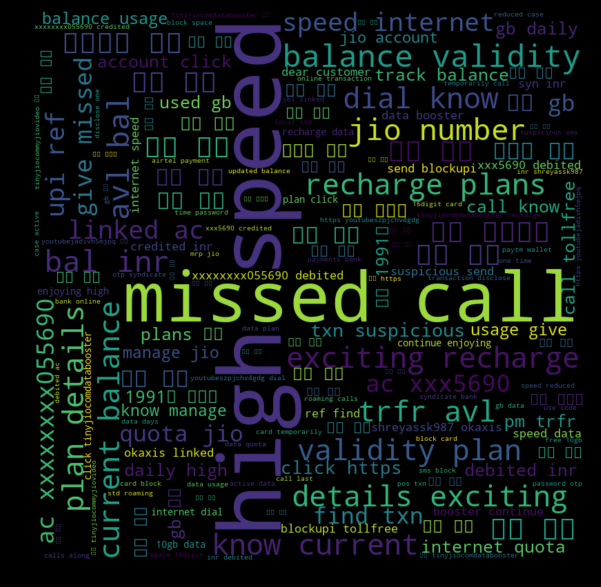

In [30]:
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
import pandas as pd 
  

comment_words = ' '
stopwords = set(STOPWORDS) 
  
# iterate through the csv file 
for val in sms3.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
          
    for words in tokens: 
        comment_words = comment_words + words + ' '
  
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='black', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = 'k') 
plt.imshow(wordcloud, interpolation = 'bilinear') 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

In [31]:
fdist_top100=fdist.most_common(100)
print(fdist_top100)

[('.', 14143), (',', 10501), (':', 4769), ('ನಿಮ್ಮ', 2380), ('data', 1950), ('%', 1819), ('!', 1788), ('call', 1662), ('inr', 1636), (')', 1586), ('(', 1583), ('a/c', 1575), ('your', 1550), ('&', 1455), ('ಮಾಡಿ', 1434), ('recharge', 1382), ('balance', 1380), ('http', 1322), ('jio', 1314), ('ಅನ್ನು', 1312), ('gb', 1283), ('6361924355', 1278), ('click', 1262), ('ಮತ್ತು', 1227), ('you', 1207), ('ಡೇಟಾ', 1169), ('get', 1154), ('https', 1135), ('speed', 1130), ('ಇಂಟರ್ನೆಟ್', 1068), ('dial', 1061), ('know', 1030), ('to', 1025), ('@', 998), ('plan', 983), ('ಬ್ಯಾಲೆನ್ಸ್', 970), ('ತಿಳಿಯಲು', 942), ('50', 903), ('ರೀಚಾರ್ಜ್', 901), ('debited', 900), ('1991', 897), ('missed', 880), ('high', 878), ('airtel', 864), ('internet', 861), ('number', 849), ('validity', 849), ('ಸ್ಪೀಡ್', 836), ('bal', 788), ('details', 784), ('rs', 771), ('avl', 769), ('ಕ್ಲಿಕ್', 762), ('txn', 742), ('ಹೈ', 730), ('account', 716), ('tollfree', 713), ('#', 696), ('exciting', 689), ('current', 683), ('credited', 679), ('1299', 672), ('p

In [32]:
print(fdist['a/c'])

1575


In [45]:
sms3.index

RangeIndex(start=0, stop=7864, step=1)

In [34]:
from sklearn.model_selection import train_test_split
import sklearn
print (sklearn.__version__)

0.20.3


In [38]:
''''print(top_3_varieties)
print(clf1.predict(count_vect.transform(["Your One Time Passw'''

'\'print(top_3_varieties)\nprint(clf1.predict(count_vect.transform(["Your One Time Passw'

In [100]:
sms_manual=sms3
sms_manual['label']=0

In [40]:
print(fdist_top100)

[('.', 14143), (',', 10501), (':', 4769), ('ನಿಮ್ಮ', 2380), ('data', 1950), ('%', 1819), ('!', 1788), ('call', 1662), ('inr', 1636), (')', 1586), ('(', 1583), ('a/c', 1575), ('your', 1550), ('&', 1455), ('ಮಾಡಿ', 1434), ('recharge', 1382), ('balance', 1380), ('http', 1322), ('jio', 1314), ('ಅನ್ನು', 1312), ('gb', 1283), ('6361924355', 1278), ('click', 1262), ('ಮತ್ತು', 1227), ('you', 1207), ('ಡೇಟಾ', 1169), ('get', 1154), ('https', 1135), ('speed', 1130), ('ಇಂಟರ್ನೆಟ್', 1068), ('dial', 1061), ('know', 1030), ('to', 1025), ('@', 998), ('plan', 983), ('ಬ್ಯಾಲೆನ್ಸ್', 970), ('ತಿಳಿಯಲು', 942), ('50', 903), ('ರೀಚಾರ್ಜ್', 901), ('debited', 900), ('1991', 897), ('missed', 880), ('high', 878), ('airtel', 864), ('internet', 861), ('number', 849), ('validity', 849), ('ಸ್ಪೀಡ್', 836), ('bal', 788), ('details', 784), ('rs', 771), ('avl', 769), ('ಕ್ಲಿಕ್', 762), ('txn', 742), ('ಹೈ', 730), ('account', 716), ('tollfree', 713), ('#', 696), ('exciting', 689), ('current', 683), ('credited', 679), ('1299', 672), ('p

In [41]:
sms_m2=sms3
sms_m2['financial']=0
sms_m2['important']=0
sms_m2['spam']=0

In [93]:
for ind in sms_m2.index: 
    if pd.Series(sms_m2['text'][ind]).str.lower().str.contains(pat = '(phonepe)|(credited)|(debited)|(a/c)|(inr)|(bal)|(bank)|(balance)|(cash)|(recharge)|(transactions)|(ac)|(ಬ್ಯಾಲೆನ್ಸ್)').bool():
        sms_m2['financial'][ind]=1
    if pd.Series(sms_m2['text'][ind]).str.lower().str.contains(pat = '(google)|(code)|(otp)|(password)|(bill)').bool():
        sms_m2['important'][ind]=1
    if pd.Series(sms_m2['text'][ind]).str.lower().str.contains(pat = '(offer)|(dial)|(bonus)|(stop)|(win)|(attention)|(query)|(ಡಯಲ್)|(deals)|(deal)|(join)|(won)|(update)|(ಅತ್ಯಾಕರ್ಷಕ)|(exciting)|(book)|(enjoy)|(thanks)|(thanks)|(download)').bool():
        sms_m2['spam'][ind]=1

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

In [95]:
sms_m2.head()

,_protocol,_address,_date,_type,_subject,_toa,_sc_toa,_service_center,_read,_status,...,_date_sent,_sub_id,_readable_date,_contact_name,length,text,label,financial,important,spam
0,0,+918310733183,1509032968509,1,NaN,NaN,NaN,9.198451e+11,1,-1,...,1509032964000,1,"Oct 26, 2017 9:19:28 PM",Chimya,146,You 1 missed call 918310733183 Last call 26...,others,0,0,1
1,0,59039004,1509034252105,1,NaN,NaN,NaN,9.182999e+11,1,-1,...,1509034247000,1,"Oct 26, 2017 9:40:52 PM",(Unknown),99,WhatsApp code 397564 You also tap link verify...,important,0,1,0
2,59,Airtel,1509037408272,1,NaN,NaN,NaN,9.198451e+11,1,-1,...,1509037401000,1,"Oct 26, 2017 10:33:28 PM",(Unknown),190,Please open following link get manual instruct...,spam,0,0,1
3,59,Airtel,1509037425141,1,NaN,NaN,NaN,9.198451e+11,1,-1,...,1509037402000,1,"Oct 26, 2017 10:33:45 PM",(Unknown),334,To enjoy fastest Airtel data speeds smartphone...,important,1,1,1
4,0,AX-RECHRG,1509065238723,1,NaN,NaN,NaN,9.198451e+11,1,-1,...,1509065233000,1,"Oct 27, 2017 6:17:18 AM",(Unknown),155,Congrats new 4G handset Exclusive offer Rs399...,spam,1,0,1


In [101]:
for ind in sms_manual.index: 
    if pd.Series(sms_manual['text'][ind]).str.lower().str.contains(pat = '(phonepe)|(credited)|(debited)|(a/c)|(inr)|(bal)|(bank)|(balance)|(cash)|(recharge)|(transactions)|(ac)|(ಬ್ಯಾಲೆನ್ಸ್)').bool():
        sms_manual['label'][ind]='financial'
    if pd.Series(sms_manual['text'][ind]).str.lower().str.contains(pat = '(google)|(code)|(otp)|(password)|(bill)').bool():
        sms_manual['label'][ind]='important'
    if pd.Series(sms_manual['text'][ind]).str.lower().str.contains(pat = '(offer)|(dial)|(bonus)|(win)|(attention)|(query)|(ಡಯಲ್)|(deals)|(deal)|(join)|(won)|(update)|(ಅತ್ಯಾಕರ್ಷಕ)|(exciting)|(book)|(enjoy)|(thanks)|(thanks)|(download)').bool():
        sms_manual['label'][ind]='spam'

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipyke

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This

C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  after removing the cwd from sys.path.
C:\Users\Sanjana Ashtaputre\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  


In [102]:
sms_manual

,_protocol,_address,_date,_type,_subject,_toa,_sc_toa,_service_center,_read,_status,...,_date_sent,_sub_id,_readable_date,_contact_name,length,text,label,financial,important,spam
0,0,+918310733183,1509032968509,1,NaN,NaN,NaN,9.198451e+11,1,-1,...,1509032964000,1,"Oct 26, 2017 9:19:28 PM",Chimya,146,You 1 missed call 918310733183 Last call 26...,spam,0,0,1
1,0,59039004,1509034252105,1,NaN,NaN,NaN,9.182999e+11,1,-1,...,1509034247000,1,"Oct 26, 2017 9:40:52 PM",(Unknown),99,WhatsApp code 397564 You also tap link verify...,important,0,1,0
2,59,Airtel,1509037408272,1,NaN,NaN,NaN,9.198451e+11,1,-1,...,1509037401000,1,"Oct 26, 2017 10:33:28 PM",(Unknown),190,Please open following link get manual instruct...,spam,0,0,1
3,59,Airtel,1509037425141,1,NaN,NaN,NaN,9.198451e+11,1,-1,...,1509037402000,1,"Oct 26, 2017 10:33:45 PM",(Unknown),334,To enjoy fastest Airtel data speeds smartphone...,spam,1,1,1
4,0,AX-RECHRG,1509065238723,1,NaN,NaN,NaN,9.198451e+11,1,-1,...,1509065233000,1,"Oct 27, 2017 6:17:18 AM",(Unknown),155,Congrats new 4G handset Exclusive offer Rs399...,spam,1,0,1
5,0,AD-OYORMS,1509091999193,1,NaN,NaN,NaN,9.198451e+11,1,-1,...,1509091973000,1,"Oct 27, 2017 1:43:19 PM",(Unknown),150,Enjoy double delight Get double occupancy roo...,spam,0,0,1
6,0,51501,1509109571178,1,NaN,NaN,NaN,9.182999e+11,1,-1,...,1509109567000,1,"Oct 27, 2017 6:36:11 PM",(Unknown),39,Your Google verification code 743610,important,0,1,0
7,0,AM-PHONPE,1509110181441,1,NaN,NaN,NaN,9.198451e+11,1,-1,...,1509110178000,1,"Oct 27, 2017 6:46:21 PM",(Unknown),117,46322 one time password proceed PhonePe It va...,important,1,1,0
8,0,AM-SYNRUP,1509110950360,1,NaN,NaN,NaN,9.198451e+11,1,-1,...,1509110946000,1,"Oct 27, 2017 6:59:10 PM",(Unknown),105,Your One Time Password OTP Syndicate Bank on...,important,1,1,0
9,0,AM-PHONPE,1509110971125,1,NaN,NaN,NaN,9.198451e+11,1,-1,...,1509110968000,1,"Oct 27, 2017 6:59:31 PM",(Unknown),134,You ve received Rs50 cashback PhonePe wallet f...,financial,1,0,0


In [103]:
sms_manual.label.replace(0,"others", inplace=True)
sms_manual.head()

,_protocol,_address,_date,_type,_subject,_toa,_sc_toa,_service_center,_read,_status,...,_date_sent,_sub_id,_readable_date,_contact_name,length,text,label,financial,important,spam
0,0,+918310733183,1509032968509,1,NaN,NaN,NaN,9.198451e+11,1,-1,...,1509032964000,1,"Oct 26, 2017 9:19:28 PM",Chimya,146,You 1 missed call 918310733183 Last call 26...,spam,0,0,1
1,0,59039004,1509034252105,1,NaN,NaN,NaN,9.182999e+11,1,-1,...,1509034247000,1,"Oct 26, 2017 9:40:52 PM",(Unknown),99,WhatsApp code 397564 You also tap link verify...,important,0,1,0
2,59,Airtel,1509037408272,1,NaN,NaN,NaN,9.198451e+11,1,-1,...,1509037401000,1,"Oct 26, 2017 10:33:28 PM",(Unknown),190,Please open following link get manual instruct...,spam,0,0,1
3,59,Airtel,1509037425141,1,NaN,NaN,NaN,9.198451e+11,1,-1,...,1509037402000,1,"Oct 26, 2017 10:33:45 PM",(Unknown),334,To enjoy fastest Airtel data speeds smartphone...,spam,1,1,1
4,0,AX-RECHRG,1509065238723,1,NaN,NaN,NaN,9.198451e+11,1,-1,...,1509065233000,1,"Oct 27, 2017 6:17:18 AM",(Unknown),155,Congrats new 4G handset Exclusive offer Rs399...,spam,1,0,1


In [104]:
#Naive bayes
import numpy as np
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfTransformer

counter = Counter(sms_manual['label'].tolist())
top_4_varieties = {i[0]: idx for idx, i in enumerate(counter.most_common(4))}
print(top_4_varieties)
sms_manual = sms_manual[sms_manual['label'].map(lambda x: x in top_4_varieties)]

{'spam': 0, 'financial': 1, 'others': 2, 'important': 3}


In [105]:
description_list = sms_manual['label'].tolist()
varietal_list = [top_4_varieties[i] for i in sms_manual['label'].tolist()]
varietal_list = np.array(varietal_list)

count_vect = CountVectorizer()
x_train_counts = count_vect.fit_transform(description_list)

tfidf_transformer = TfidfTransformer()
x_train_tfidf = tfidf_transformer.fit_transform(x_train_counts)

train_x, test_x, train_y, test_y = train_test_split(x_train_tfidf, varietal_list, test_size=0.3)

clf = MultinomialNB().fit(train_x, train_y)
y_score = clf.predict(test_x)

n_right = 0
for i in range(len(y_score)):
    if y_score[i] == test_y[i]:
        n_right += 1
        
#print("Accuracy: %.2f%%" % ((n_right/float(len(train_y)) * 100)))
print("Accuracy: %.2f%%" % ((n_right/float(len(test_y)) * 100)))


Accuracy: 100.00%


In [108]:
#SVC
from sklearn.svm import SVC
svc = SVC()
description_list = sms_manual['label'].tolist()
varietal_list = [top_4_varieties[i] for i in sms_manual['label'].tolist()]
print(top_4_varieties)
varietal_list = np.array(varietal_list)

count_vect = CountVectorizer()
x_train_counts = count_vect.fit_transform(description_list)


tfidf_transformer = TfidfTransformer()
x_train_tfidf = tfidf_transformer.fit_transform(x_train_counts)

train_x, test_x, train_y, test_y = train_test_split(x_train_tfidf, varietal_list, test_size=0.3)

clf1 = SVC(kernel='linear').fit(train_x, train_y)
y_score = clf1.predict(test_x)

n_right = 0
for i in range(len(y_score)):
    if y_score[i] == test_y[i]:
        n_right += 1

#print("Accuracy: %.2f%%" % ((n_right/float(len(train_y)) * 100)))
print("Accuracy: %.2f%%" % ((n_right/float(len(test_y)) * 100)))


{'spam': 0, 'financial': 1, 'others': 2, 'important': 3}
Accuracy: 100.00%


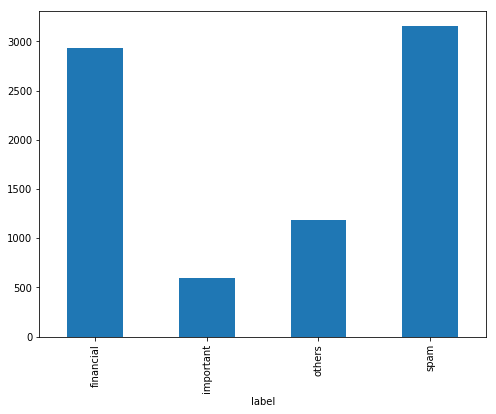

In [109]:
fig=plt.figure(figsize=(8,6))
sms_manual.groupby(sms_manual['label']).text.count().plot.bar(ylim=0)
plt.show()

In [110]:
#sms_manual.to_csv("sms_manual1.csv")